Here, we use control plots to identify areas with high activity in the detector (hotspots).

In [51]:
import sys
sys.path.append('/lhome/ific/c/ccortesp/Analysis')

from libs import crudo
from libs import fit_functions as ff
from libs import plotting_tools as pt

from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import os
import pandas as pd
from PIL import Image                         # type: ignore

# Styling Plot
pt.ccortesp_plot_style()
PRELIM_LOGO = np.asarray(Image.open('/lhome/ific/c/ccortesp/Analysis/images/next_logo_preliminary.png'))

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Preliminary

In [2]:
# List of low background runs
runs_info = {
                # # Condition 0:  castle = open #
                # 15062: {"duration": 84783, "OK": 69564, "LOST": 133911, "condition": 0},
                # 15063: {"duration": 79120, "OK": 65052, "LOST": 124131, "condition": 0},
                # 15076: {"duration": 69316, "OK": 56775, "LOST": 108095, "condition": 0},
                # # Condition 1:  castle = pclosed & RAS = on #
                # 15288: {"duration": 87256, "OK": 30201, "LOST": 8397  , "condition": 1},
                # 15289: {"duration": 82152, "OK": 28180, "LOST": 7884  , "condition": 1},
                # 15290: {"duration": 61295, "OK": 20931, "LOST": 5915  , "condition": 1},
                # # Condition 2:  castle = pclosed & RAS = off #
                # 15299: {"duration": 60204, "OK": 18014, "LOST": 8929  , "condition": 2},
                # 15318: {"duration": 86706, "OK": 28735, "LOST": 10115 , "condition": 2},
                # 15319: {"duration": 85823, "OK": 27973, "LOST": 10086 , "condition": 2},
                # 15330: {"duration": 86462, "OK": 28157, "LOST": 10432 , "condition": 2},
                # 15331: {"duration": 85389, "OK": 27390, "LOST": 9966  , "condition": 2},
                # 15332: {"duration": 67758, "OK": 22010, "LOST": 8142  , "condition": 2},      # Loosely estimated
                # 15462: {"duration": 39365, "OK": 12847, "LOST": 4532  , "condition": 2},
                # 15472: {"duration": 86563, "OK": 28505, "LOST": 10015 , "condition": 2},      # Loosely estimated
                # 15478: {"duration": 86835, "OK": 28702, "LOST": 9999  , "condition": 2},
                # 15479: {"duration": 86876, "OK": 28713, "LOST": 10036 , "condition": 2},
                # 15484: {"duration": 86538, "OK": 28188, "LOST": 10465 , "condition": 2},
                # 15485: {"duration": 86186, "OK": 28281, "LOST": 10309 , "condition": 2},
                # 15486: {"duration": 86578, "OK": 28700, "LOST": 10361 , "condition": 2},
                # 15487: {"duration": 86456, "OK": 28703, "LOST": 9952  , "condition": 2},
                # 15488: {"duration": 86367, "OK": 28891, "LOST": 10049 , "condition": 2},
                # 15489: {"duration": 60554, "OK": 20059, "LOST": 7031  , "condition": 2},
                # Condition 3:  castle = closed & RAS = on #
                # 15502: {"duration": 85477, "OK": 28287, "LOST": 9564  , "condition": 3},
                # 15504: {"duration": 85194, "OK": 28297, "LOST": 9537  , "condition": 3},
                # 15505: {"duration": 86517, "OK": 28632, "LOST": 9725  , "condition": 3},
                # 15506: {"duration": 84841, "OK": 28438, "LOST": 9603  , "condition": 3},
                # 15507: {"duration": 55740, "OK": 18569, "LOST": 6149  , "condition": 3},
                # 15514: {"duration": 59207, "OK": 20054, "LOST": 6646  , "condition": 3},
                # 15519: {"duration": 34045, "OK": 11420, "LOST": 3646  , "condition": 3},
                # 15520: {"duration": 85170, "OK": 28050, "LOST": 9130  , "condition": 3},
                # 15521: {"duration": 85388, "OK": 28396, "LOST": 8831  , "condition": 3},
                # 15527: {"duration": 69725, "OK": 23560, "LOST": 7411  , "condition": 3},
                # 15528: {"duration": 41361, "OK": 13460, "LOST": 4426  , "condition": 3},
                # 15535: {"duration": 84904, "OK": 28799, "LOST": 9156  , "condition": 3},
                # 15539: {"duration": 56567, "OK": 15618, "LOST": 9586  , "condition": 3},
                # 15540: {"duration": 67663, "OK": 22526, "LOST": 7066  , "condition": 3},
                # 15541: {"duration": 86630, "OK": 29124, "LOST": 9333  , "condition": 3},
                # 15542: {"duration": 87915, "OK": 29717, "LOST": 9274  , "condition": 3},
                # 15543: {"duration": 86570, "OK": 29160, "LOST": 9123  , "condition": 3},
                # 15544: {"duration": 86566, "OK": 29498, "LOST": 9029  , "condition": 3},
                # 15545: {"duration": 85892, "OK": 29437, "LOST": 8877  , "condition": 3},
                # 15546: {"duration": 84822, "OK": 28663, "LOST": 8704  , "condition": 3},
                # 15547: {"duration": 71594, "OK": 24549, "LOST": 7421  , "condition": 3},
                # 15557: {"duration": 66088, "OK": 22273, "LOST": 6929  , "condition": 3},

                # ----- P E R I O D  0 2 ----- #
                
                # # Jul 2025: castle = closed & RAS = off #
                # 15609: {"duration": 79563, "OK": 28168, "LOST": 8392 , "condition": 2},
                # 15614: {"duration": 81279, "OK": 28543, "LOST": 8472 , "condition": 2},
                # 15615: {"duration": 86302, "OK": 30165, "LOST": 9046 , "condition": 2},
                # 15616: {"duration": 86146, "OK": 30386, "LOST": 8635 , "condition": 2},
                # 15617: {"duration": 88041, "OK": 31274, "LOST": 8983 , "condition": 2},
                # 15618: {"duration": 82577, "OK": 29104, "LOST": 8619 , "condition": 2},
                # 15619: {"duration": 77964, "OK": 27411, "LOST": 7930 , "condition": 2},
                # 15621: {"duration": 83287, "OK": 29261, "LOST": 8351 , "condition": 2},
                # 15622: {"duration": 90371, "OK": 31543, "LOST": 9167 , "condition": 2},
                # 15623: {"duration": 80748, "OK": 28474, "LOST": 8300 , "condition": 2},
                # 15624: {"duration": 64650, "OK": 22921, "LOST": 6461 , "condition": 2},
                # Aug 2025: castle = closed & RAS = on #
                15625: {"duration": 87329, "OK": 30498, "LOST": 8570, "condition": 3},
                15626: {"duration": 107092, "OK": 37665, "LOST": 10446, "condition": 3},
                15627: {"duration": 61872, "OK": 21967, "LOST": 6238, "condition": 3},
                15632: {"duration": 86709, "OK": 30444, "LOST": 8826, "condition": 3},
                15633: {"duration": 86076, "OK": 30070, "LOST": 8578, "condition": 3},
                15634: {"duration": 86545, "OK": 30372, "LOST": 8234, "condition": 3},
                15635: {"duration": 86545, "OK": 30372, "LOST": 9016, "condition": 3},
                15636: {"duration": 84284, "OK": 29394, "LOST": 8465, "condition": 3},
                15637: {"duration": 76285, "OK": 26571, "LOST": 7422, "condition": 3},
                15639: {"duration": 87347, "OK": 30861, "LOST": 8525, "condition": 3},
                15640: {"duration": 30714, "OK": 10700, "LOST": 3170, "condition": 3},
                15642: {"duration": 25075, "OK": 8722 , "LOST": 2437, "condition": 3},
                15643: {"duration": 89049, "OK": 31554, "LOST": 8674, "condition": 3},
                15644: {"duration": 85486, "OK": 30518, "LOST": 8297, "condition": 3},
                15645: {"duration": 85729, "OK": 30510, "LOST": 8318, "condition": 3}, 
                15647: {"duration": 86629, "OK": 30767, "LOST": 8406, "condition": 3},
                15648: {"duration": 86466, "OK": 31033, "LOST": 8393, "condition": 3},
                15649: {"duration": 86270, "OK": 30639, "LOST": 8153, "condition": 3},
                15650: {"duration": 22096, "OK": 8044 , "LOST": 2227, "condition": 3},
                15655: {"duration": 80788, "OK": 28802, "LOST": 7950, "condition": 3},
                15656: {"duration": 85998, "OK": 30696, "LOST": 8311, "condition": 3},
                15657: {"duration": 86237, "OK": 30399, "LOST": 8587, "condition": 3},
                15658: {"duration": 86032, "OK": 30601, "LOST": 8224, "condition": 3},
                15659: {"duration": 86242, "OK": 31012, "LOST": 8390, "condition": 3},
                # 15660: {"duration": 85797, "OK": 31112, "LOST": 8269, "condition": 3},      # Failed run due to SiPM overcurrent
                # 15661: {"duration": 76792, "OK": 27556, "LOST": 7183, "condition": 3},    # Failed run due to SiPM overcurrent
                # 15667: {"duration": 46716, "OK": 16472, "LOST": 4611, "condition": 3},    # Failed run due to SiPM overcurrent
                15669: {"duration": 81128, "OK": 28934, "LOST": 8059, "condition": 3},
                15670: {"duration": 86214, "OK": 31038, "LOST": 8499, "condition": 3},
                15671: {"duration": 86950, "OK": 31309, "LOST": 8268, "condition": 3},
                15672: {"duration": 86315, "OK": 31207, "LOST": 8214, "condition": 3},
                # # Sep 2025
                15673: {"duration": 81544, "OK": 29419, "LOST": 7850, "condition": 3},
                15675: {"duration": 85817, "OK": 30257, "LOST": 8928, "condition": 3},
                15676: {"duration": 79211, "OK": 28268, "LOST": 8289, "condition": 3},
                # 15679: {"duration": 83742, "OK": 29177, "LOST": 9790, "condition": 3},    # Afected run due to RAS issues
                # 15680: {"duration": 85296, "OK": 29183, "LOST": 9747, "condition": 3},    # Afected run due to RAS issues
                15681: {"duration": 86023, "OK": 29606, "LOST": 9625, "condition": 3},
                15682: {"duration": 65708, "OK": 22534, "LOST": 7483, "condition": 3},
                15687: {"duration": 86309, "OK": 29497, "LOST": 10048, "condition": 3},
                15688: {"duration": 86399, "OK": 29702, "LOST": 10080, "condition": 3},
                15689: {"duration": 85830, "OK": 29836, "LOST": 10086, "condition": 3},
                15693: {"duration": 86133, "OK": 29546, "LOST": 9912, "condition": 3},
                15694: {"duration": 86542, "OK": 29877, "LOST": 9894, "condition": 3},
                15695: {"duration": 86075, "OK": 30004, "LOST": 9982, "condition": 3},
                15696: {"duration": 87682, "OK": 30263, "LOST": 10084, "condition": 3},
                15697: {"duration": 86373, "OK": 29462, "LOST": 9872, "condition": 3},
                15698: {"duration": 90027, "OK": 31671, "LOST": 10056, "condition": 3},
                15699: {"duration": 86278, "OK": 30129, "LOST": 9810, "condition": 3},
                15700: {"duration": 86613, "OK": 30194, "LOST": 9827, "condition": 3},
                15701: {"duration": 87385, "OK": 28775, "LOST": 9605, "condition": 3},      # Data hang!
                15709: {"duration": 57503, "OK": 20381, "LOST": 6441, "condition": 3},      # PMT failed completely
                15724: {"duration": 66550, "OK": 23477, "LOST": 7439, "condition": 3},
                15729: {"duration": 85812, "OK": 30016, "LOST": 9663, "condition": 3},
                15730: {"duration": 87572, "OK": 30329, "LOST": 9960, "condition": 3},
                15731: {"duration": 86561, "OK": 30155, "LOST": 9790, "condition": 3},
                15732: {"duration": 85314, "OK": 29641, "LOST": 9508, "condition": 3},
                15733: {"duration": 86919, "OK": 30475, "LOST": 10027, "condition": 3},
                15734: {"duration": 85790, "OK": 29837, "LOST": 9598, "condition": 3},
                15735: {"duration": 87451, "OK": 30547, "LOST": 9958, "condition": 3},
                15736: {"duration": 93376, "OK": 32622, "LOST": 10506, "condition": 3},
                15737: {"duration": 52343, "OK": 18365, "LOST": 5844, "condition": 3},
            }

In [3]:
# ----- Directory ----- #
DATA_DIR = '/lustre/ific.uv.es/prj/gl/neutrinos/users/ccortesp/NEXT-100/Backgrounds/h5/runs/'
# Example tags: '_other', '_p2_nhit5', '_nhit5_Qthres7' (this is basically p1_nhit5)
VERSION_TAG = '_p2_nhit5'

# ----- .txt with Runs Extra Info ----- #
TXT_NAME = 'summary' + VERSION_TAG +'.txt'
TXT_PATH = os.path.join('/lhome/ific/c/ccortesp/Analysis/NEXT-100/Backgrounds/txt/', TXT_NAME)

EXTRA_INFO_DF = pd.read_csv(TXT_PATH, sep="\t", index_col='Run_ID')
print(f'Extra information of {EXTRA_INFO_DF.shape[0]} runs loaded!')

# ----- Nested DataFrames ----- #
# The dfs are stored in different dictionaries defined by:
# CITIES    = ['Sophronia', 'Event']
PARTICLES = ['Electron', 'Alpha']
REGIONS   = ['Inclusive', 'Fiducial', 'Tube', 'Anode', 'Cathode']

# Specific options for some plots
CITIES    = ['Event']
# PARTICLES = ['Electron']
# REGIONS   = ['Anode', 'Cathode']

Extra information of 72 runs loaded!


### Detector Conditions

In [4]:
# --- Period 01 --- #

CPC_RAS = 1746791100      # Castle = partially closed & RAS = on
CPC     = 1747042200      # Castle = partially closed & RAS = off
CC_RAS  = 1749024786      # Castle = closed & RAS = on

# --- Period 02 --- #

CC_02      = 1753092000   # Castle = closed & RAS = off
CC_RAS_02  = 1754035200   # Castle = closed & RAS = on

## Selected Data

Choose the condition flag for the runs you want to merge!

In [5]:
CONDITION_FLAG = 3

In [6]:
# Store the selected data here
SEL_DATA = {cond: {     
                        'DAQ_time':  None,              # Corrected DAQ time
                        'Sophronia': {'Alpha'   : {'Inclusive': {}, 'Fiducial': {}, 'Tube': {}, 'Anode': {}, 'Cathode': {}}, 
                                      'Electron': {'Inclusive': {}, 'Fiducial': {}, 'Tube': {}, 'Anode': {}, 'Cathode': {}}},
                        'Event':     {'Alpha'   : {'Inclusive': {}, 'Fiducial': {}, 'Tube': {}, 'Anode': {}, 'Cathode': {}}, 
                                      'Electron': {'Inclusive': {}, 'Fiducial': {}, 'Tube': {}, 'Anode': {}, 'Cathode': {}}}
                    }
                     
            for cond in [0, 1, 2, 3]}

### Merged DAQ Information

In [7]:
# Global
DAQ_time = 0.0

# ----- Run Loop ----- #
for run_id, entry in runs_info.items():

    # Run information
    run_long = entry["duration"]
    run_OK   = entry["OK"]
    run_LOST = entry["LOST"]
    run_cond = entry["condition"]

    # Just merge the chosen condition
    if run_cond != CONDITION_FLAG:
        continue   

    # DAQe efficiency + error
    DAQe_CV, DAQe_error = ff.efficiency(run_OK, run_LOST)
    print(f'Run {run_id}: DAQeff = {DAQe_CV:.4f} ± {DAQe_error:.4f}')

    # DAQe corrected time
    DAQ_time += run_long * DAQe_CV

# Store the DAQ time
SEL_DATA[CONDITION_FLAG]['DAQ_time'] = DAQ_time

Run 15625: DAQeff = 0.7806 ± 0.0021
Run 15626: DAQeff = 0.7829 ± 0.0019
Run 15627: DAQeff = 0.7788 ± 0.0025
Run 15632: DAQeff = 0.7752 ± 0.0021
Run 15633: DAQeff = 0.7780 ± 0.0021
Run 15634: DAQeff = 0.7867 ± 0.0021
Run 15635: DAQeff = 0.7711 ± 0.0021
Run 15636: DAQeff = 0.7764 ± 0.0021
Run 15637: DAQeff = 0.7817 ± 0.0022
Run 15639: DAQeff = 0.7836 ± 0.0021
Run 15640: DAQeff = 0.7714 ± 0.0036
Run 15642: DAQeff = 0.7816 ± 0.0039
Run 15643: DAQeff = 0.7844 ± 0.0021
Run 15644: DAQeff = 0.7862 ± 0.0021
Run 15645: DAQeff = 0.7858 ± 0.0021
Run 15647: DAQeff = 0.7854 ± 0.0021
Run 15648: DAQeff = 0.7871 ± 0.0021
Run 15649: DAQeff = 0.7898 ± 0.0021
Run 15650: DAQeff = 0.7832 ± 0.0041
Run 15655: DAQeff = 0.7837 ± 0.0021
Run 15656: DAQeff = 0.7869 ± 0.0021
Run 15657: DAQeff = 0.7797 ± 0.0021
Run 15658: DAQeff = 0.7882 ± 0.0021
Run 15659: DAQeff = 0.7871 ± 0.0021
Run 15669: DAQeff = 0.7821 ± 0.0021
Run 15670: DAQeff = 0.7850 ± 0.0021
Run 15671: DAQeff = 0.7911 ± 0.0020
Run 15672: DAQeff = 0.7916 ±

### Merge Data

In [8]:
print(f'Merging selected data for condition {CONDITION_FLAG}!\n')

for city in CITIES:
    for particle in PARTICLES:
        for region in REGIONS:

            print(f"Processing {city}/{particle}/{region}:")

            all_dfs = []
            global_event_counter = 0

            # ----- Run Loop ----- #
            for run_id, entry in runs_info.items():

                # Run information
                run_cond = entry["condition"]

                # Just merge the chosen condition
                if run_cond != CONDITION_FLAG:
                    continue

                # Load the HDF5 file
                h5_path = os.path.join(DATA_DIR, f'run_{run_id}{VERSION_TAG}.h5')
                # Key inside the HDF5 file
                h5_key = f'{city}/{particle}/{region}'

                try:
                    df = pd.DataFrame()
                    df = pd.read_hdf(h5_path, key=h5_key)

                    # ----- Global Event ID ----- #
                    if city == 'Event':
                        
                        df['run_id']    = run_id
                        df['global_id'] = global_event_counter + np.arange(len(df))
                        
                        # Update the global event counter
                        global_event_counter += len(df)

                    all_dfs.append(df)

                except FileNotFoundError:
                    print(f"Warning: File '{h5_path}' not found. Skipping this run.")
                    continue
                except KeyError as e:
                    print(f"Warning: Key '{e.args[0]}' not found in file '{h5_path}'. Skipping this file.")

            # ----- Concatenate Data ----- #
            final_df  = pd.DataFrame()

            if all_dfs:
                final_df = pd.concat(all_dfs, ignore_index=True)
                print(f"  {len(all_dfs)} DataFrames concatenated, with final shape: {final_df.shape}\n")

            else:
                print(f"  No DataFrames found for {CONDITION_FLAG}/{city}/{particle}/{region}. Skipping...\n")
                continue

            # ----- Save Combined Data ----- #
            SEL_DATA[CONDITION_FLAG][city][particle][region] = final_df

print("Y ya eso es todo, eso es todo.")

Merging selected data for condition 3!

Processing Event/Electron/Inclusive:
  56 DataFrames concatenated, with final shape: (467338, 8)

Processing Event/Electron/Fiducial:
  56 DataFrames concatenated, with final shape: (12778, 8)

Processing Event/Electron/Tube:
  56 DataFrames concatenated, with final shape: (358025, 8)

Processing Event/Electron/Anode:
  56 DataFrames concatenated, with final shape: (52448, 8)

Processing Event/Electron/Cathode:
  56 DataFrames concatenated, with final shape: (44087, 8)

Processing Event/Alpha/Inclusive:
  56 DataFrames concatenated, with final shape: (236018, 8)

Processing Event/Alpha/Fiducial:
  56 DataFrames concatenated, with final shape: (48612, 8)

Processing Event/Alpha/Tube:
  56 DataFrames concatenated, with final shape: (29019, 8)

Processing Event/Alpha/Anode:
  56 DataFrames concatenated, with final shape: (6565, 8)

Processing Event/Alpha/Cathode:
  56 DataFrames concatenated, with final shape: (151822, 8)

Y ya eso es todo, eso es t

#### Store it ma'boy!

Should I store this merged HDF5 files? probably yes!

# Control Plots

We are interested in geometrical plots and their comparison between detector regions defined previously.
<br>
Let's start with the _inclusive_ region!

Electrons inclusive event rate = 134.1478 mHz (467338 events / 3483753.9083 s)


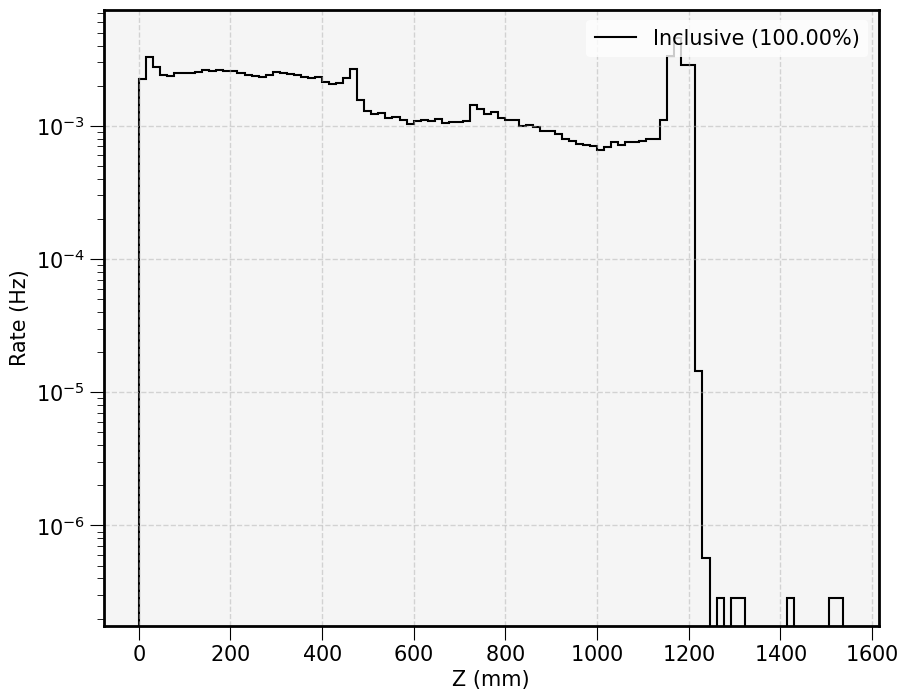

Alphas inclusive event rate = 67.7482 mHz (236018 events / 3483753.9083 s)


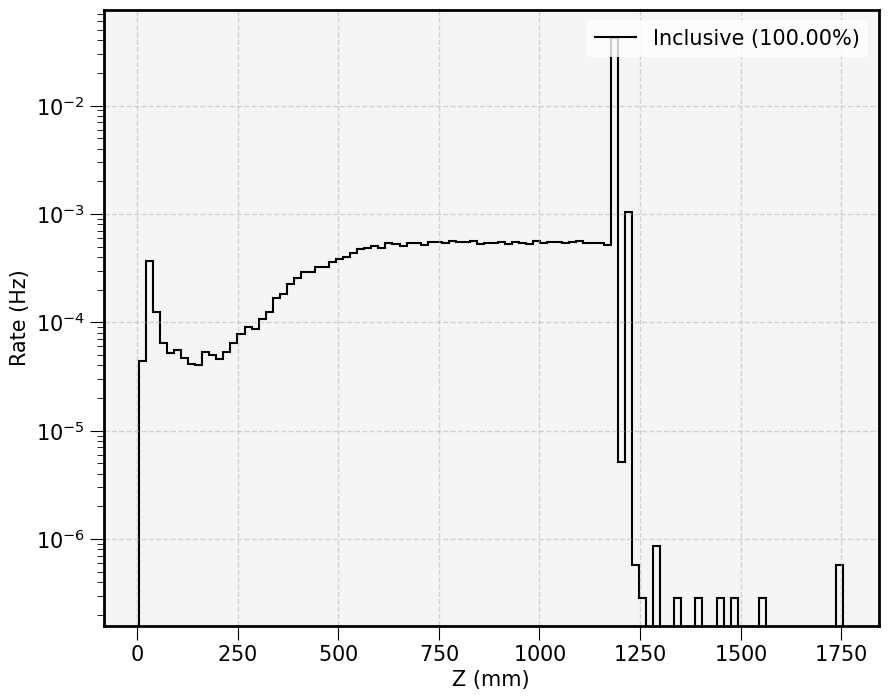

In [9]:
# Global
n_bins = 100
evts_all = 0
rate_all = 0

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        # Dataframe
        data = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']

        # Variables
        Z = data['Z']

        # Histogram: normalized by corrected DAQ data taking time
        Z_counts, Z_edges = np.histogram(Z, bins=n_bins)
        Z_rate = Z_counts / DAQ_time

        evts_all = data.global_id.nunique()
        rate_all = Z_rate.sum()

        # ----- Plotting ----- #
        plt.stairs(Z_rate, Z_edges, label=f'Inclusive ({data.global_id.nunique() / evts_all:.2%})', 
                    fill=False, lw=1.5, ec=pt.hist_colors[0])
            
        print(f'{particle}s inclusive event rate = {rate_all*1e3:.4f} mHz ({evts_all} events / {DAQ_time:.4f} s)')

        # ----- Styling ----- #
        plt.xlabel('Z (mm)')
        # plt.xlim(0, pt.N100_hei+50)
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        # plt.title(f'Event-level: {particle}s')
        plt.legend()

        plt.grid(True)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

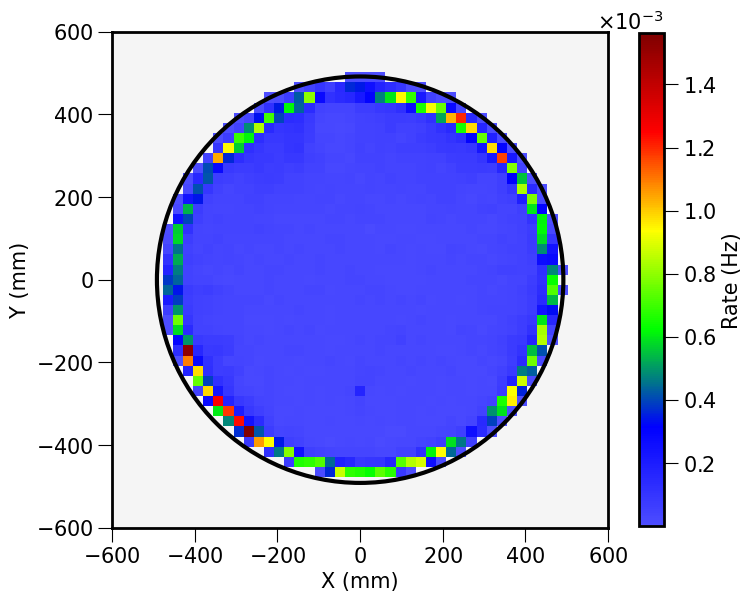

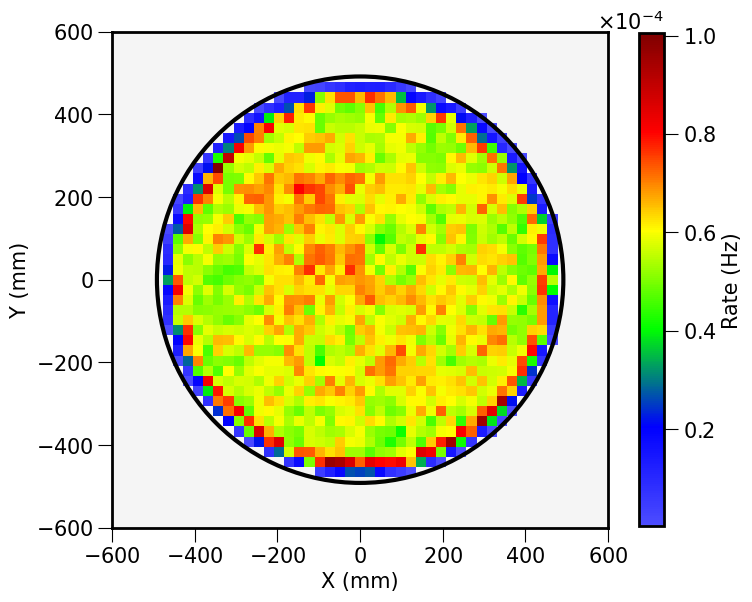

In [10]:
# Global
n_bins = 50

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        # Dataframe
        data = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']

        # Variables
        X = data['X']
        Y = data['Y']

        # 2D histogram: normalized by corrected DAQ data taking time
        XY_hit_map, ex, ey = pt.mapping(X, Y, xy_bins=n_bins, pos=True)
        XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
        XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

        # ----- Plotting ----- #
        plt.figure(figsize=(8, 8))
        im = plt.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto')
        cbar = plt.colorbar(im, label='Rate (Hz)', shrink=0.80)
        cbar.formatter.set_powerlimits((-3, 3))
        plt.xlabel('X (mm)')
        # plt.xlim(-500, 500)
        plt.ylabel('Y (mm)')
        # plt.ylim(-500, 500)
        # plt.title(f'Event-level: Inclusive {particle}s')

        plt.gca().add_patch(pt.plot_circle(pt.N100_rad, LINESTYLE='-'))
        plt.gca().set_aspect('equal', adjustable='box')
        plt.gca().set_facecolor("whitesmoke")
        # plt.tight_layout()
        plt.show()

## Fiducial

### Z Distribution

#### Event-level

Electrons inclusive event rate = 134.15 mHz (467338 evts / 3483753.91 s)


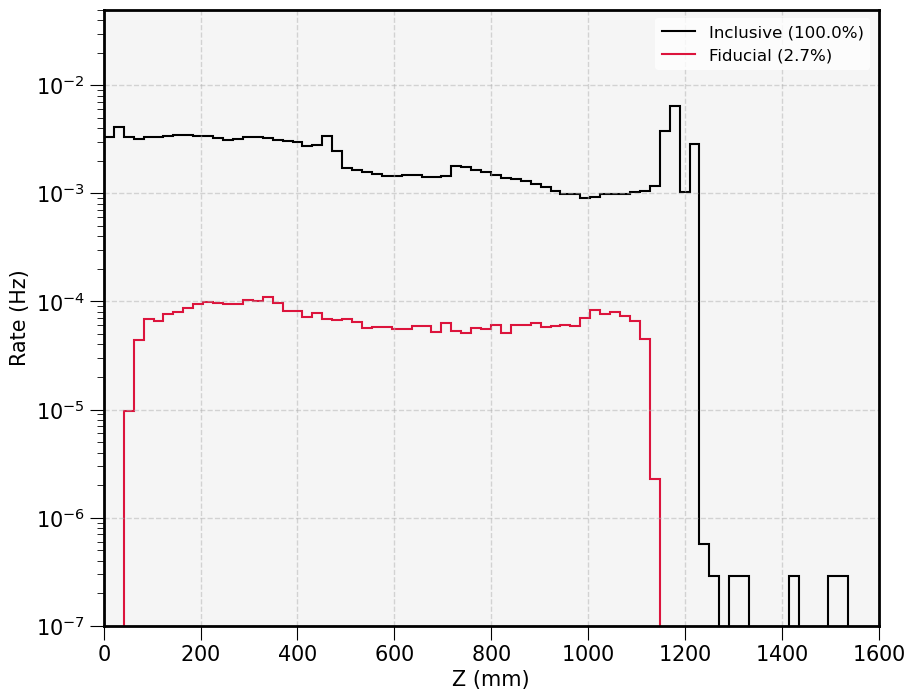

Alphas inclusive event rate = 67.75 mHz (236018 evts / 3483753.91 s)


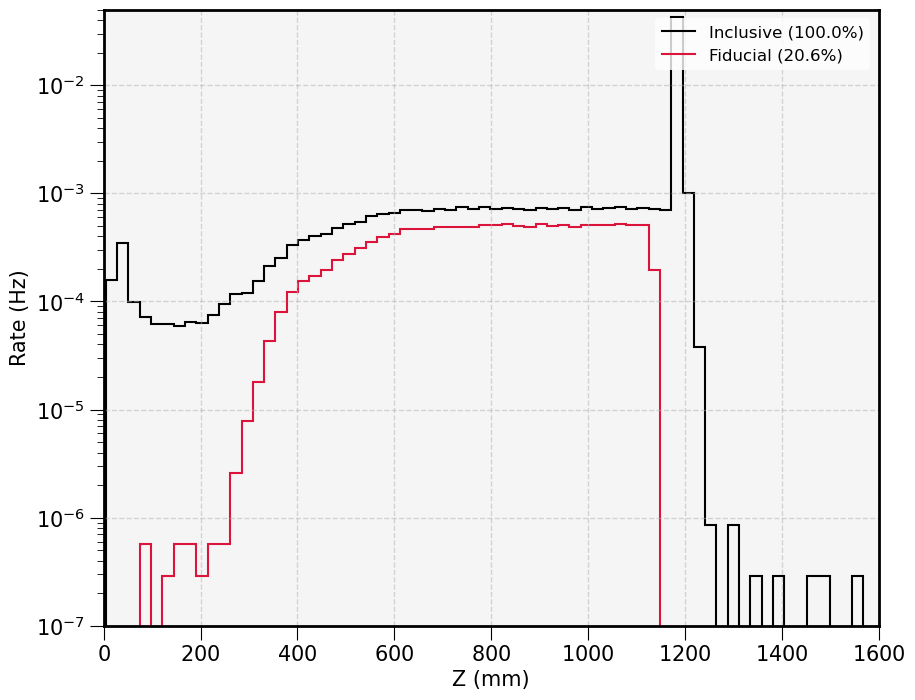

In [39]:
# Global
n_bins = 75

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        evts_all = 0
        rate_all = 0

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']
        _, Z_edges = np.histogram(data_all['Z'], bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Fiducial']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Event'][particle][region]

            # Variables
            Z = data['Z']

            # Histogram: normalized by corrected DAQ data taking time
            Z_counts, _ = np.histogram(Z, bins=Z_edges)
            Z_rate = Z_counts / DAQ_time

            # Events and rate counter
            if region == 'Inclusive':
                evts_all = data.global_id.nunique()
                rate_all = Z_rate.sum()

            # ----- Plotting ----- #
            plt.stairs(Z_rate, Z_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.1%})', 
                       fill=False, lw=1.5, ec=pt.hist_colors[k % len(pt.hist_colors)])
            
        print(f'{particle}s inclusive event rate = {rate_all*1e3:.2f} mHz ({evts_all} evts / {DAQ_time:.2f} s)')

        # ----- Styling ----- #
        plt.xlabel('Z (mm)')
        plt.xlim(0, 1600)
        plt.ylabel('Rate (Hz)')
        plt.ylim(1e-7, 0.5e-1)
        plt.yscale('log')
        # plt.title(f'Event-level: {particle}s')
        plt.legend(fontsize=12)

        plt.grid(True)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

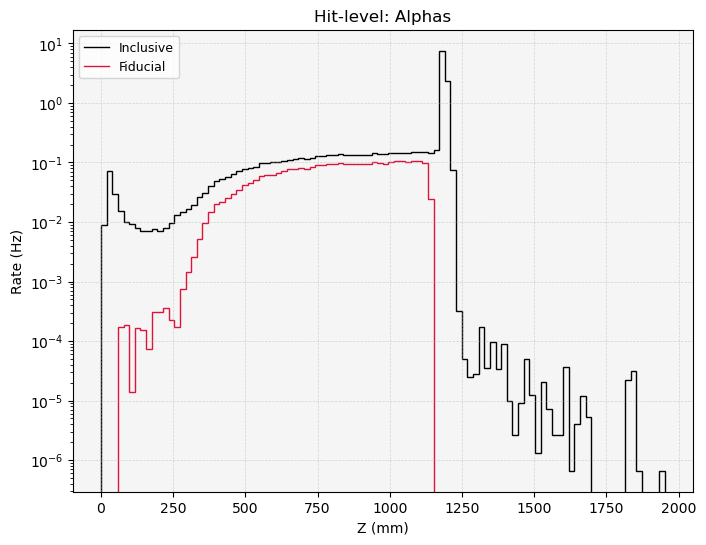

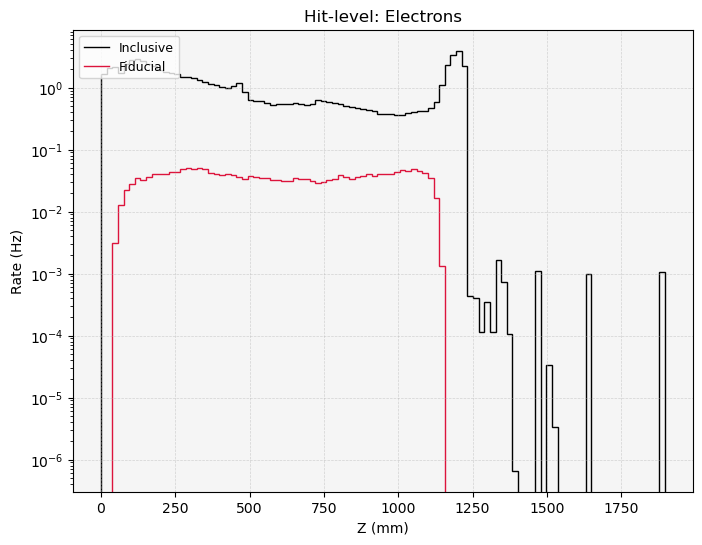

In [ ]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        plt.figure(figsize=(8, 6))

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Sophronia'][particle]['Inclusive']
        _, Z_edges = np.histogram(data_all['Z'], bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Fiducial']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Sophronia'][particle][region]

            # Variables
            Z = data['Z']

            # Histogram: normalized by corrected DAQ data taking time
            Z_counts, _ = np.histogram(Z, bins=Z_edges)
            Z_rate = Z_counts / DAQ_time

            # ----- Plotting ----- #
            plt.stairs(Z_rate, Z_edges, label=f'{region}', 
                       fill=False, lw=1.0, ec=pt.hist_colors[k % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel('Z (mm)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        plt.title(f'Hit-level: {particle}s')
        plt.legend(loc='upper left', fontsize=9)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

### XY Map

#### Event-level

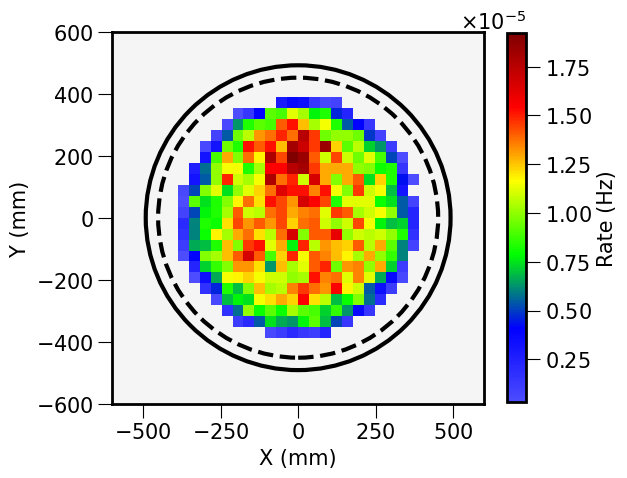

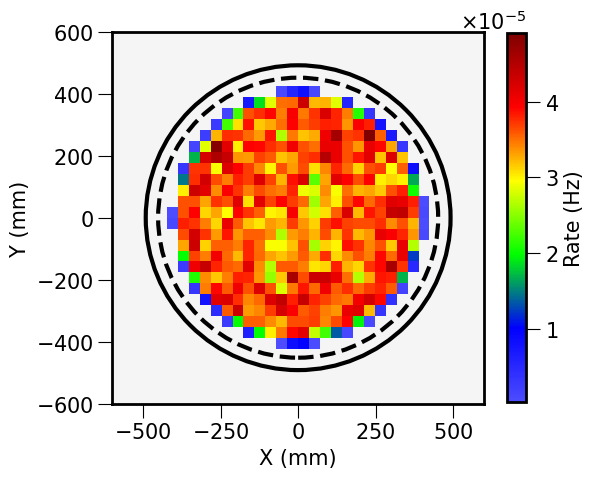

In [40]:
# Global
n_bins = 35

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        # Dataframe
        data = SEL_DATA[condition_flag]['Event'][particle]['Fiducial']

        # Variables
        X = data['X']
        Y = data['Y']

        # 2D histogram: normalized by corrected DAQ data taking time
        XY_hit_map, ex, ey = pt.mapping(X, Y, xy_bins=n_bins, pos=True)
        XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
        XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

        # ----- Plotting ----- #
        plt.figure(figsize=(6, 6))
        im = plt.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto')
        cbar = plt.colorbar(im, label='Rate (Hz)', shrink=0.8)
        cbar.formatter.set_powerlimits((-3, 3))
        plt.xlabel('X (mm)')
        plt.ylabel('Y (mm)')
        # plt.title(f'Event-level: {particle}s @ Fiducial')

        plt.gca().add_patch(pt.plot_circle(pt.N100_rad, LINESTYLE='-'))
        plt.gca().add_patch(pt.plot_circle(451.65, LINESTYLE='--'))
        plt.gca().set_aspect('equal', adjustable='box')
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

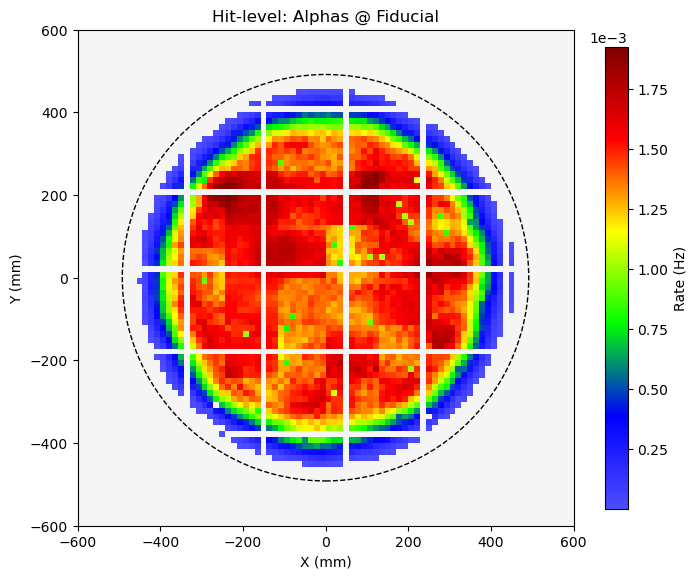

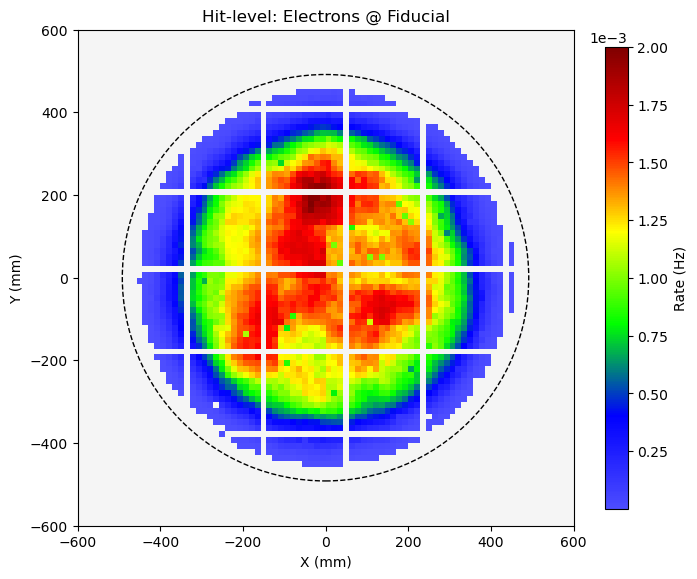

In [ ]:
# Global
n_bins = 85

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        # Dataframe
        data = SEL_DATA[condition_flag]['Sophronia'][particle]['Fiducial']

        # Variables
        X = data['X']
        Y = data['Y']

        # 2D histogram: normalized by corrected DAQ data taking time
        XY_hit_map, ex, ey = pt.mapping(X, Y, xy_bins=n_bins, pos=True)
        XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
        XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

        # ----- Plotting ----- #
        plt.figure(figsize=(5, 5))
        im = plt.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto')
        cbar = plt.colorbar(im, label='Rate (Hz)', shrink=0.75)
        cbar.formatter.set_powerlimits((-3, 3))
        plt.xlabel('X (mm)')
        plt.ylabel('Y (mm)')
        plt.title(f'Hit-level: {particle}s @ Fiducial')

        plt.gca().add_patch(pt.plot_circle(pt.N100_rad))
        plt.gca().set_aspect('equal', adjustable='box')
        plt.gca().set_facecolor("whitesmoke")
        plt.tight_layout()
        plt.show()

### $\phi$ Distribution

#### Event-level

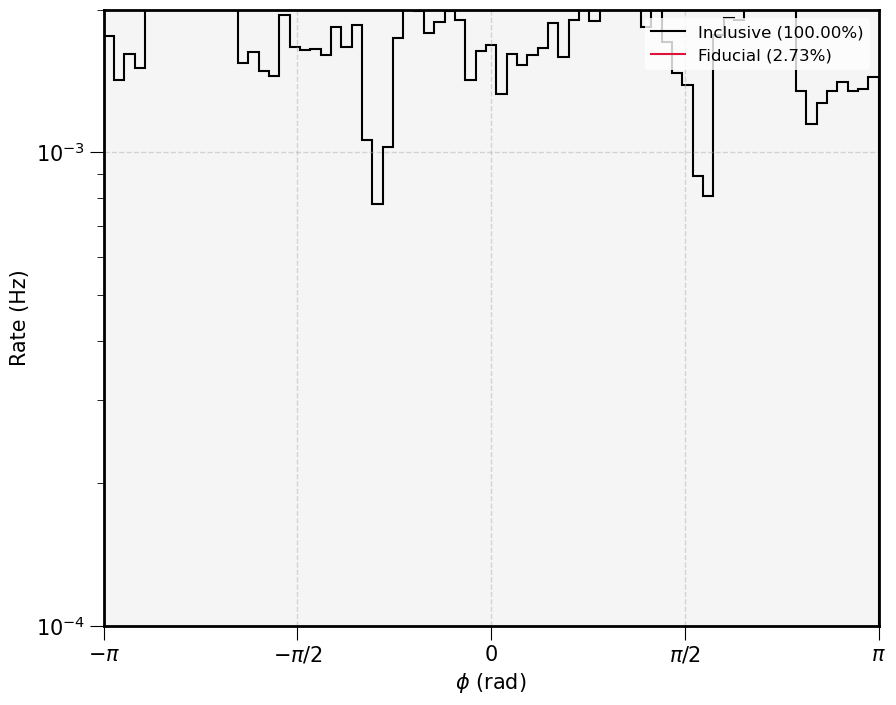

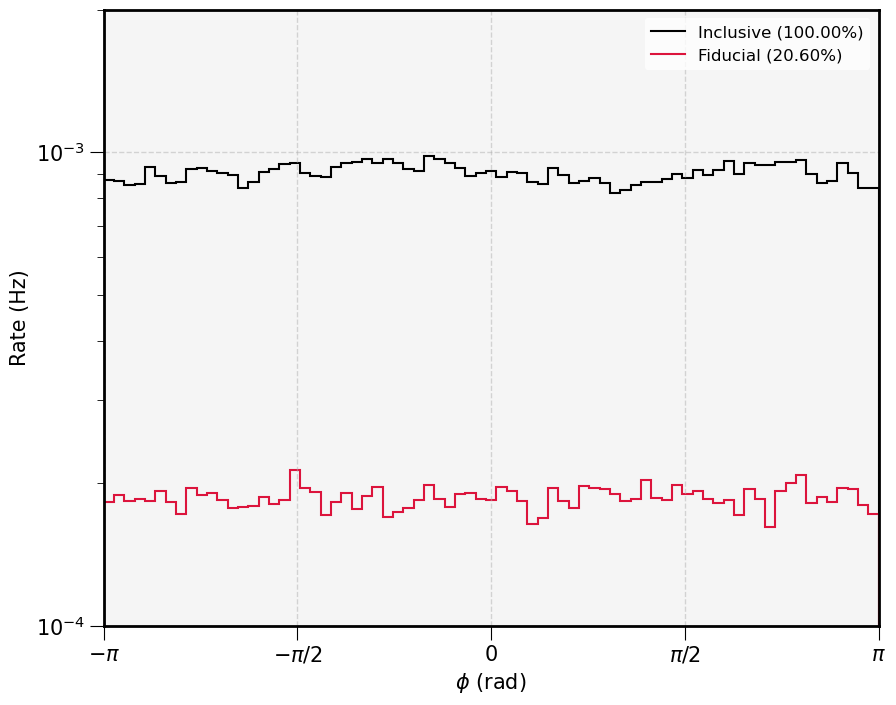

In [59]:
# Global
n_bins = 75

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:
        
        evts_all = 0

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']
        _, phi_edges = np.histogram(np.arctan2(data_all['Y'], data_all['X']), bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Fiducial']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Event'][particle][region]

            # Variables
            X = data['X']
            Y = data['Y']
            phi = np.arctan2(Y, X)

            # Histogram: normalized by corrected DAQ data taking time
            phi_counts, _ = np.histogram(phi, bins=phi_edges)
            phi_rate = phi_counts / DAQ_time

            # Events and rate counter
            if region == 'Inclusive':
                evts_all = data.global_id.nunique()

            # ----- Plotting ----- #
            plt.stairs(phi_rate, phi_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.2%})', 
                       fill=False, lw=1.5, ec=pt.hist_colors[k % len(pt.hist_colors)])
            # plt.stairs(phi_rate, phi_edges, label=f'{region}', 
            #            fill=False, lw=1.5, ec=pt.hist_colors[1])

        # ----- Styling ----- #
        plt.xlabel(r'$\phi$ (rad)')
        plt.xlim(-np.pi, np.pi)
        plt.ylabel('Rate (Hz)')
        plt.ylim(1e-4, 2e-3)
        plt.yscale('log')
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        # plt.title(f'Event-level: {particle}s')
        plt.legend(fontsize=12)

        # Set x-ticks as multiples of π
        ticks = np.arange(-np.pi, np.pi + 0.1, np.pi / 2)
        tick_labels = [r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$']
        plt.xticks(ticks, tick_labels)

        plt.grid(True)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

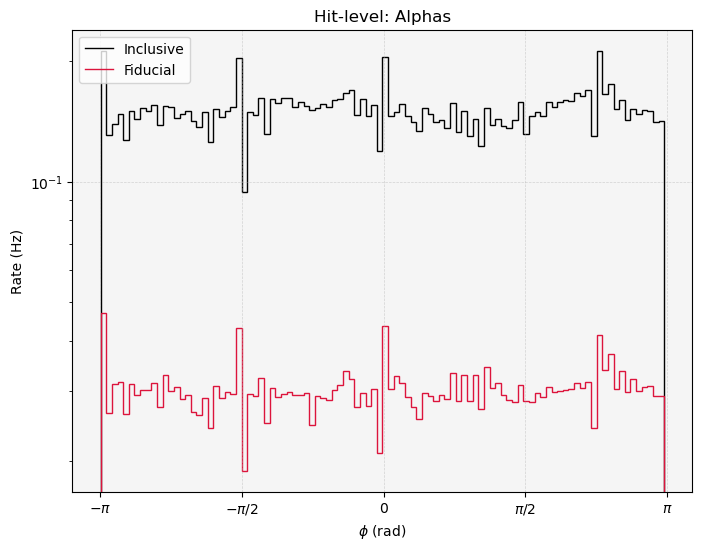

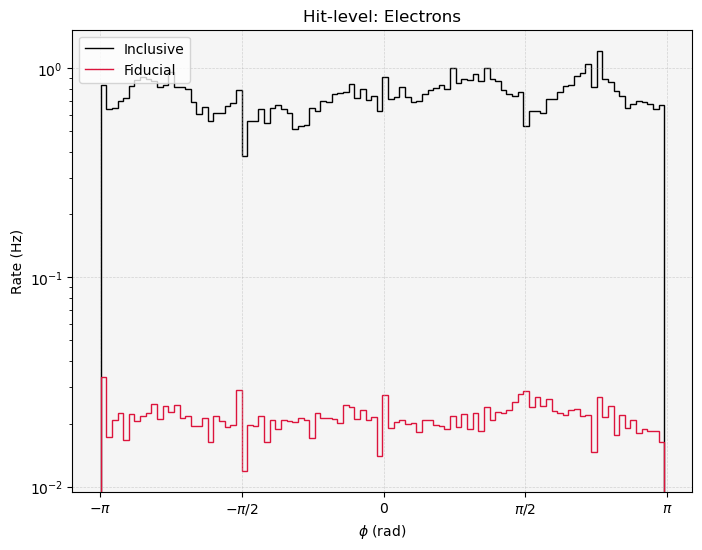

In [ ]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        plt.figure(figsize=(8, 6))

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Sophronia'][particle]['Inclusive']
        _, phi_edges = np.histogram(np.arctan2(data_all['Y'], data_all['X']), bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Fiducial']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Sophronia'][particle][region]

            # Variables
            X = data['X']
            Y = data['Y']
            phi = np.arctan2(Y, X)

            # Histogram: normalized by corrected DAQ data taking time
            phi_counts, _ = np.histogram(phi, bins=phi_edges)
            phi_rate = phi_counts / DAQ_time

            # ----- Plotting ----- #
            plt.stairs(phi_rate, phi_edges, label=f'{region}', 
                       fill=False, lw=1.0, ec=pt.hist_colors[k % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'$\phi$ (rad)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Hit-level: {particle}s')
        plt.legend(loc='upper left', fontsize=10)

        # Set x-ticks as multiples of π
        ticks = np.arange(-np.pi, np.pi + 0.1, np.pi / 2)
        tick_labels = [r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$']
        plt.xticks(ticks, tick_labels)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

## Light Tube

### Z Distribution

#### Event-level

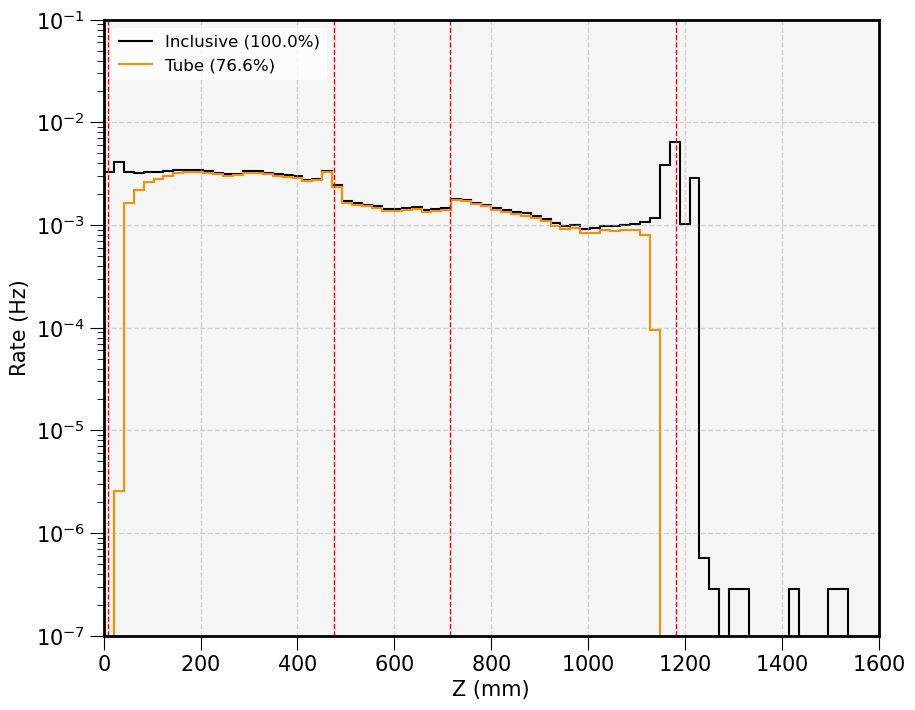

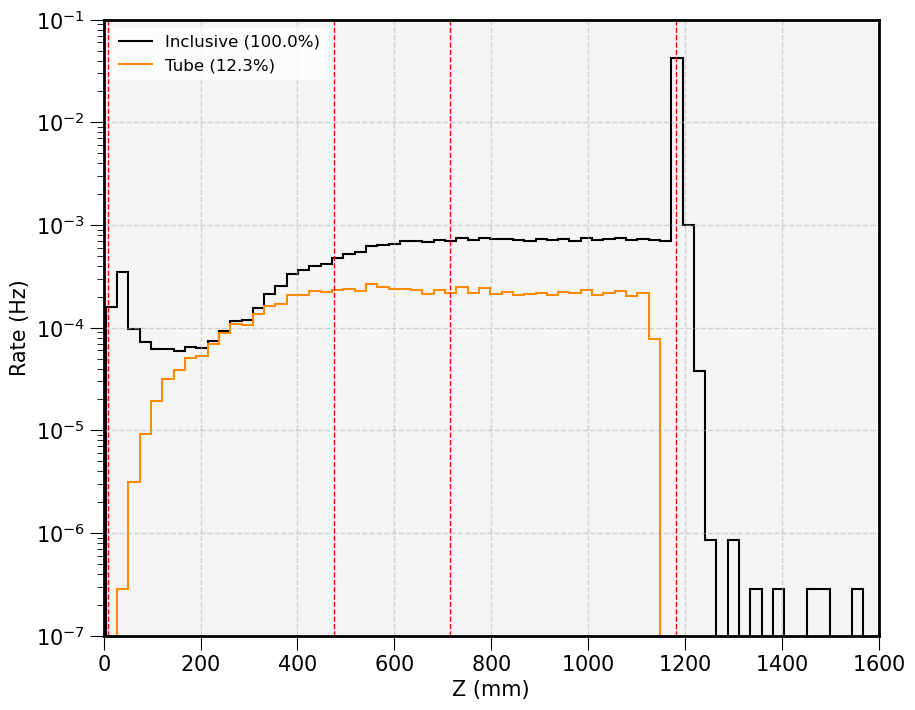

In [91]:
# Global
n_bins = 75

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:
        
        evts_all = 0
        rate_all = 0

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']
        _, Z_edges = np.histogram(data_all['Z'], bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Tube']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Event'][particle][region]

            # Variables
            Z = data['Z']

            # Histogram: normalized by corrected DAQ data taking time
            Z_counts, _ = np.histogram(Z, bins=Z_edges)
            Z_rate = Z_counts / DAQ_time

            # Events and rate counter
            if region == 'Inclusive':
                evts_all = data.global_id.nunique()

            # ----- Plotting ----- #
            plt.stairs(Z_rate, Z_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.1%})', 
                       fill=False, lw=1.5, ec=pt.hist_colors[k*2 % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel('Z (mm)')
        plt.xlim(0, 1600)
        plt.ylabel('Rate (Hz)')
        plt.ylim(1e-7, 1e-1)
        plt.yscale('log')
        # plt.title(f'Event-level: {particle}s')
        plt.legend(loc='upper left', fontsize=12)

        # Lines of the light tube joints
        for joint in [10, 475, 716, 1181]:
            plt.axvline(x=joint, color='red', ls='--', lw=1.0)

        plt.grid(True)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

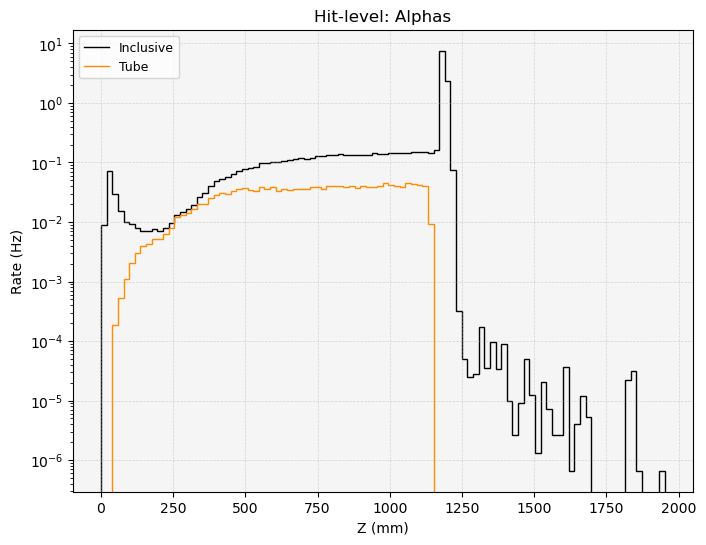

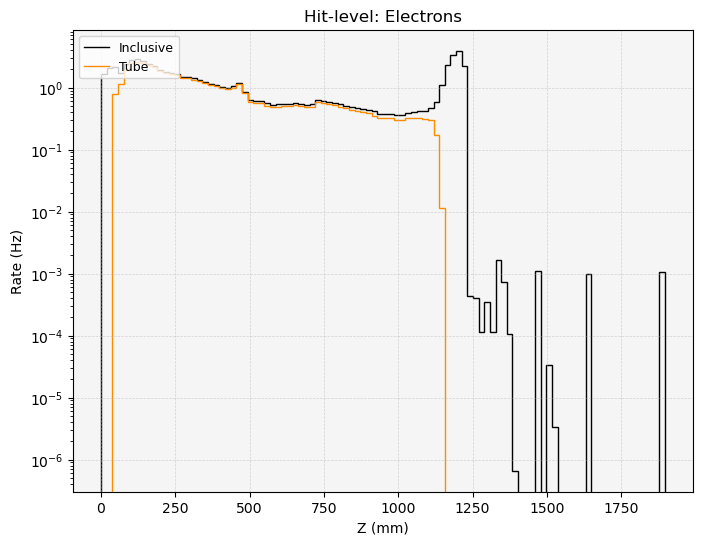

In [ ]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        plt.figure(figsize=(8, 6))

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Sophronia'][particle]['Inclusive']
        _, Z_edges = np.histogram(data_all['Z'], bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Tube']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Sophronia'][particle][region]

            # Variables
            Z = data['Z']

            # Histogram: normalized by corrected DAQ data taking time
            Z_counts, _ = np.histogram(Z, bins=Z_edges)
            Z_rate = Z_counts / DAQ_time

            # ----- Plotting ----- #
            plt.stairs(Z_rate, Z_edges, label=f'{region}', 
                       fill=False, lw=1.0, ec=pt.hist_colors[2*k % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel('Z (mm)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        plt.title(f'Hit-level: {particle}s')
        plt.legend(loc='upper left', fontsize=9)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

### XY Map

#### Event-level

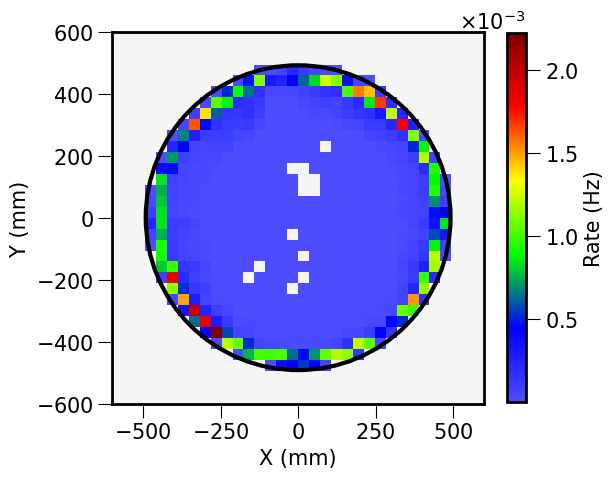

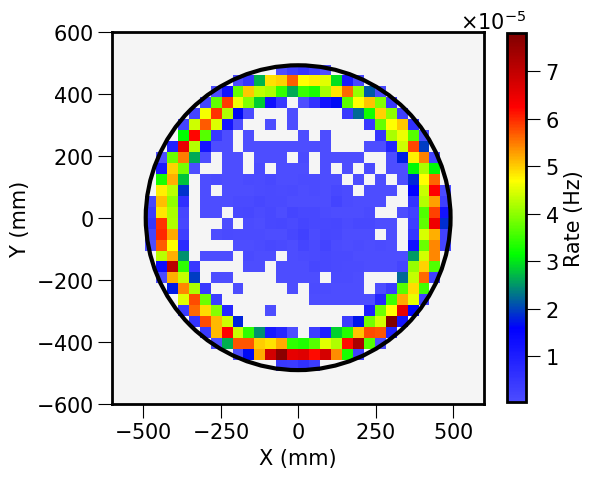

In [79]:
# Global
n_bins = 35

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        # Dataframe
        data = SEL_DATA[condition_flag]['Event'][particle]['Tube']

        # Variables
        X = data['X']
        Y = data['Y']

        # 2D histogram: normalized by corrected DAQ data taking time
        XY_hit_map, ex, ey = pt.mapping(X, Y, xy_bins=n_bins, pos=True)
        XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
        XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

        # ----- Plotting ----- #
        plt.figure(figsize=(6, 6))
        im = plt.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto')
        cbar = plt.colorbar(im, label='Rate (Hz)', shrink=0.80)
        cbar.formatter.set_powerlimits((-3, 3))
        plt.xlabel('X (mm)')
        plt.ylabel('Y (mm)')
        # plt.title(f'Event-level: {particle}s @ Light Tube')

        plt.gca().add_patch(pt.plot_circle(pt.N100_rad, LINESTYLE='-'))
        plt.gca().set_aspect('equal', adjustable='box')
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

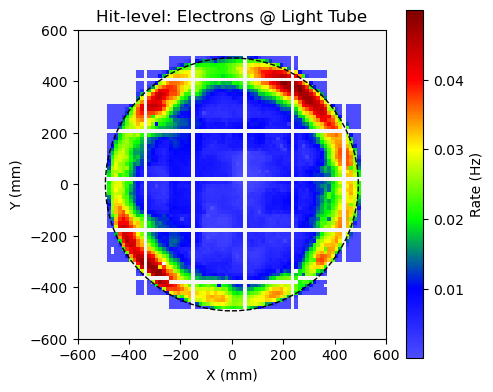

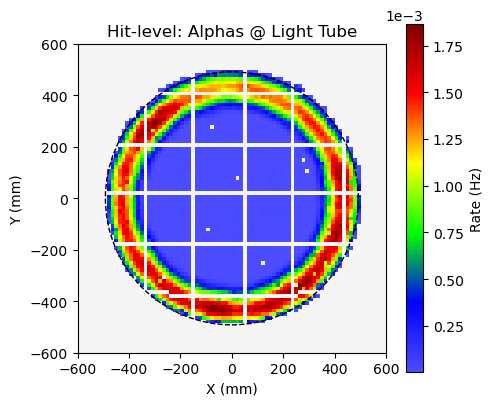

In [51]:
# Global
n_bins = 85

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = sel_data[condition_flag]['DAQ_time']

    for particle in particles:

        # Dataframe
        data = sel_data[condition_flag]['Sophronia'][particle]['Tube']

        # Variables
        X = data['X']
        Y = data['Y']

        # 2D histogram: normalized by corrected DAQ data taking time
        XY_hit_map, ex, ey = pt.mapping(X, Y, xy_bins=n_bins, pos=True)
        XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
        XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

        # ----- Plotting ----- #
        plt.figure(figsize=(5, 5))
        im = plt.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto')
        cbar = plt.colorbar(im, label='Rate (Hz)', shrink=0.75)
        cbar.formatter.set_powerlimits((-3, 3))
        plt.xlabel('X (mm)')
        plt.ylabel('Y (mm)')
        plt.title(f'Hit-level: {particle}s @ Light Tube')

        plt.gca().add_patch(pt.plot_circle(pt.N100_rad))
        plt.gca().set_aspect('equal', adjustable='box')
        plt.gca().set_facecolor("whitesmoke")
        plt.tight_layout()
        plt.show()

### $\phi$ Distribution

#### Event-level

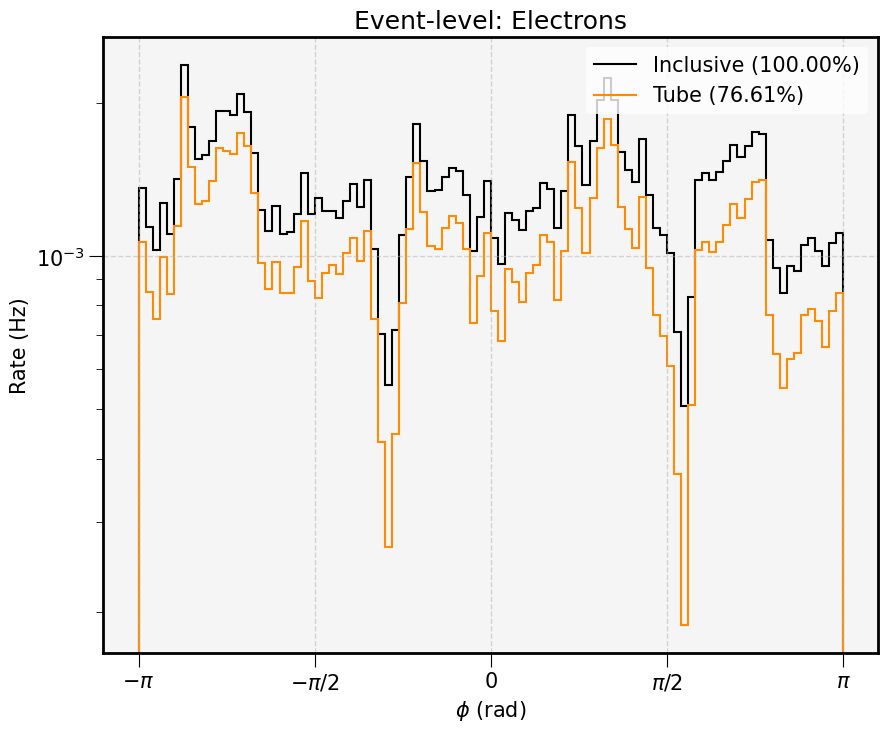

In [19]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        evts_all = 0

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']
        _, phi_edges = np.histogram(np.arctan2(data_all['Y'], data_all['X']), bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Tube']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Event'][particle][region]

            # Variables
            X = data['X']
            Y = data['Y']
            phi = np.arctan2(Y, X)

            # Histogram: normalized by corrected DAQ data taking time
            phi_counts, _ = np.histogram(phi, bins=phi_edges)
            phi_rate = phi_counts / DAQ_time

            # Events and rate counter
            if region == 'Inclusive':
                evts_all = data.global_id.nunique()

            # ----- Plotting ----- #
            plt.stairs(phi_rate, phi_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.2%})', 
                       fill=False, lw=1.5, ec=pt.hist_colors[k*2 % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'$\phi$ (rad)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Event-level: {particle}s')
        plt.legend()

        # Set x-ticks as multiples of π
        ticks = np.arange(-np.pi, np.pi + 0.1, np.pi / 2)
        tick_labels = [r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$']
        plt.xticks(ticks, tick_labels)

        plt.grid(True)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

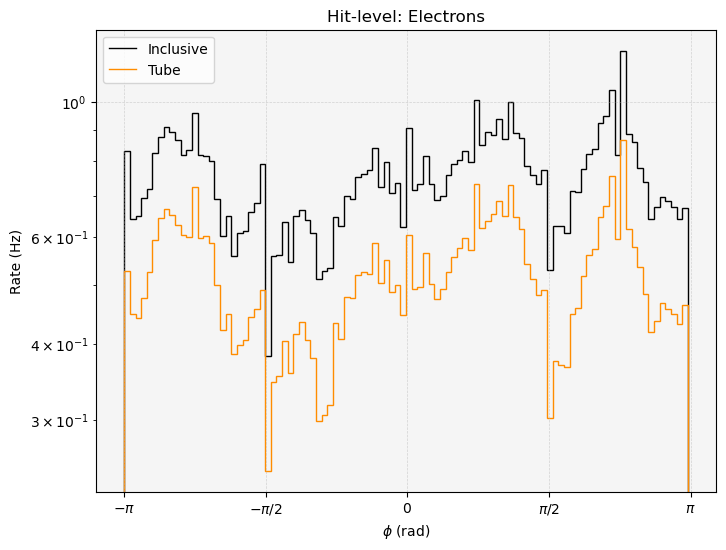

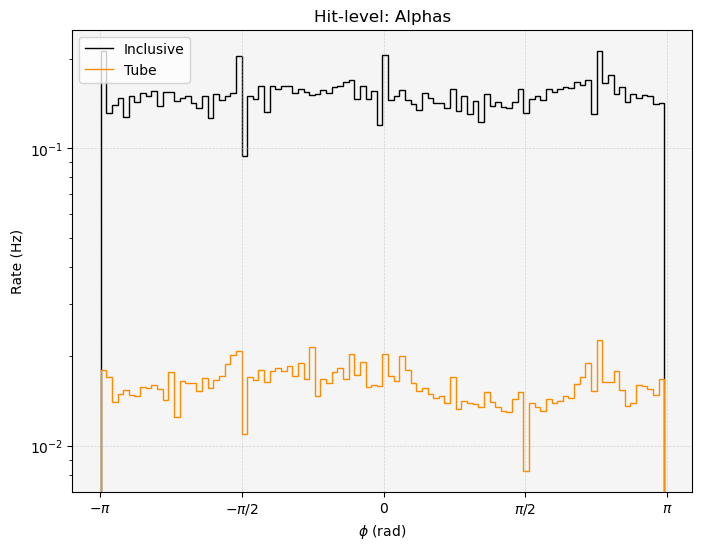

In [ ]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        plt.figure(figsize=(8, 6))

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Sophronia'][particle]['Inclusive']
        _, phi_edges = np.histogram(np.arctan2(data_all['Y'], data_all['X']), bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Tube']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Sophronia'][particle][region]

            # Variables
            X = data['X']
            Y = data['Y']
            phi = np.arctan2(Y, X)

            # Histogram: normalized by corrected DAQ data taking time
            phi_counts, _ = np.histogram(phi, bins=phi_edges)
            phi_rate = phi_counts / DAQ_time

            # ----- Plotting ----- #
            plt.stairs(phi_rate, phi_edges, label=f'{region}', 
                       fill=False, lw=1.0, ec=pt.hist_colors[k*2 % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'$\phi$ (rad)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Hit-level: {particle}s')
        plt.legend(loc='upper left', fontsize=9)

        # Set x-ticks as multiples of π
        ticks = np.arange(-np.pi, np.pi + 0.1, np.pi / 2)
        tick_labels = [r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$']
        plt.xticks(ticks, tick_labels)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

### Extra Plots

#### Let's chop up $Z$

There are three different regions in the light tube, defined under the following limits:
<br>
- __S1__: $10  \lt Z \leq 475$
- __S2__: $475 \lt Z \leq 716$
- __S3__: $716 \lt Z \leq 1181$

In [ ]:
test = SEL_DATA[3]['Event']['Electron']['Tube']
test

In [23]:
TUBE_JOINTS = [10, 475, 716, 1181]
# SECT_LIMITS = [(0, 500), (500, 700), (700, 1181)]
SECT_LIMITS = [(0, 600), (600, 1200)]

for city in CITIES:
    for particle in PARTICLES:

        # Filter the data for the current city and particle
        particle_data = SEL_DATA[CONDITION_FLAG][city][particle]['Tube']

        # Initialize the 'section' column with NaN
        particle_data['section'] = np.nan

        for i, lim in enumerate(SECT_LIMITS):

            # Select the section of the tube
            particle_data.loc[
                (particle_data['Z'] > lim[0]) & (particle_data['Z'] <= lim[1]),
                'section'
            ] = i+1

        # Update the data in the original DataFrame
        # SEL_DATA[CONDITION_FLAG][city][particle]['Tube']['section'] = particle_data['section']

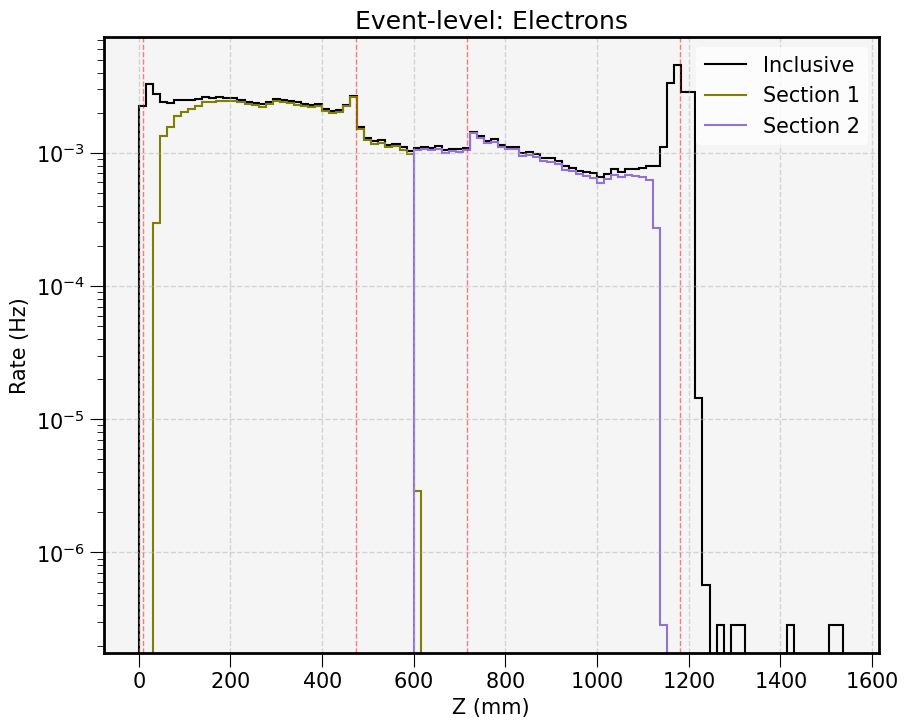

In [ ]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']
        _, Z_edges = np.histogram(data_all['Z'], bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Tube']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Event'][particle][region]

            if region == 'Tube':
                for section in [1, 2]:
                    # Filter data by section
                    section_data = data[data['section'] == section]

                    # Variables
                    Z = section_data['Z']

                    # Histogram: normalized by corrected DAQ data taking time
                    Z_counts, _ = np.histogram(Z, bins=Z_edges)
                    Z_rate = Z_counts / DAQ_time

                    # ----- Plotting ----- #
                    plt.stairs(Z_rate, Z_edges, label=f'Section {section}', 
                        fill=False, lw=1.5, ec=pt.hist_colors[(6*k + section) % len(pt.hist_colors)])
            else:
                # Variables
                Z = data['Z']

                # Histogram: normalized by corrected DAQ data taking time
                Z_counts, _ = np.histogram(Z, bins=Z_edges)
                Z_rate = Z_counts / DAQ_time

                # ----- Plotting ----- #
                plt.stairs(Z_rate, Z_edges, label=f'{region}', 
                    fill=False, lw=1.5, ec=pt.hist_colors[k % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel('Z (mm)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        plt.title(f'Event-level: {particle}s')
        plt.legend()

        # Lines of the light tube joints
        for joint in TUBE_JOINTS:
            plt.axvline(x=joint, color='red', ls='--', lw=1.0, alpha=0.5)

        plt.grid(True)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

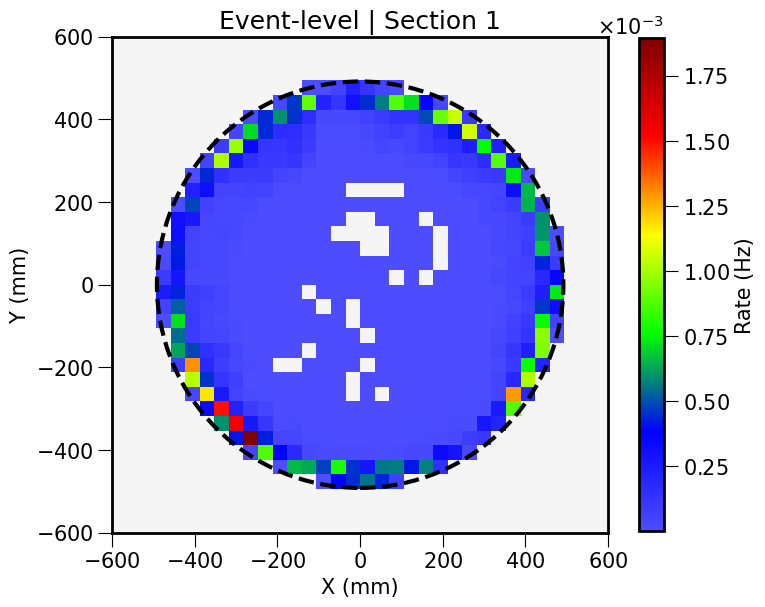

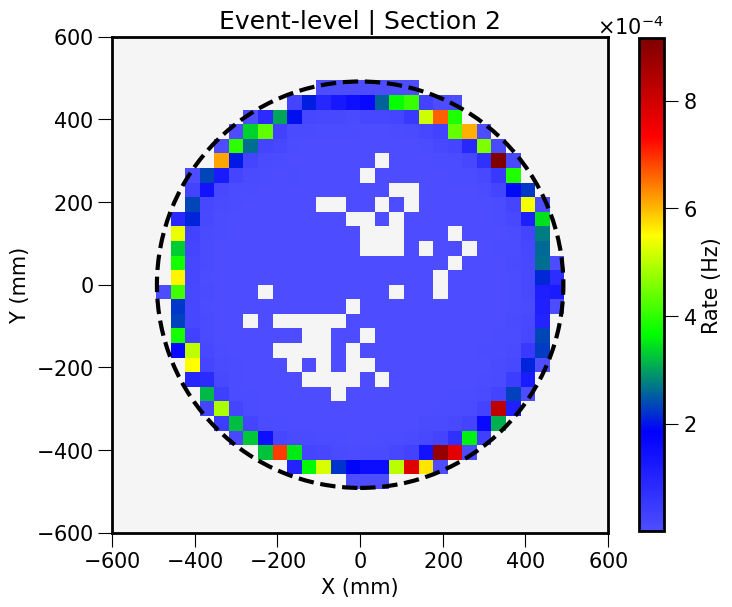

In [17]:
# Global
n_bins = 35

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        # Dataframe
        data = SEL_DATA[condition_flag]['Event'][particle]['Tube']

        for section in [1, 2]:

            # Filter data by section
            section_data = data[data['section'] == section]

            # Variables
            X = section_data['X']
            Y = section_data['Y']

            # 2D histogram: normalized by corrected DAQ data taking time
            XY_hit_map, ex, ey = pt.mapping(X, Y, xy_bins=n_bins, pos=True)
            XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
            XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

            # ----- Plotting ----- #
            plt.figure(figsize=(8, 8))
            im = plt.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto')
            cbar = plt.colorbar(im, label='Rate (Hz)', shrink=0.80)
            cbar.formatter.set_powerlimits((-3, 3))
            plt.xlabel('X (mm)')
            plt.ylabel('Y (mm)')
            plt.title(f'Event-level | Section {section}')

            plt.gca().add_patch(pt.plot_circle(pt.N100_rad))
            plt.gca().set_aspect('equal', adjustable='box')
            plt.gca().set_facecolor("whitesmoke")
            plt.show()

#### Now, let's see how Z distribution changes by quadrants

In [24]:
test_df = SEL_DATA[3]['Event']['Electron']['Tube']
test_df

,event,time,X,Y,Z,E_corr,run_id,global_id,quadrant,section
0,485,1.754042e+09,365.008412,-182.820222,183.629889,1.950754,15625,0,4,1.0
1,516,1.754042e+09,42.065968,448.227957,739.693827,0.624047,15625,1,1,2.0
2,1097,1.754042e+09,-415.905645,-168.998549,1041.164365,0.602823,15625,2,3,2.0
3,1409,1.754042e+09,259.122038,326.912128,196.411803,1.916779,15625,3,1,1.0
4,1482,1.754042e+09,101.585382,-445.807941,751.675344,0.665332,15625,4,4,2.0
...,...,...,...,...,...,...,...,...,...,...
358020,1789721,1.759302e+09,-287.537683,340.981254,102.262619,0.500013,15737,358020,2,1.0
358021,1790071,1.759302e+09,-229.018344,-319.569621,278.208029,0.918561,15737,358021,3,1.0
358022,1790324,1.759302e+09,-247.458353,292.381789,299.354945,2.533197,15737,358022,2,1.0
358023,1790838,1.759302e+09,450.300559,-88.107956,413.939096,1.164422,15737,358023,4,1.0


In [ ]:
for city in CITIES:
    for particle in PARTICLES:

        # Filter the data for the current city and particle
        tube_df = SEL_DATA[CONDITION_FLAG][city][particle]['Tube']

        # Quadrants conditions and values
        conditions = [
                        (tube_df['X'] >= 0) & (tube_df['Y'] >= 0),  # Q1
                        (tube_df['X'] <  0) & (tube_df['Y'] >= 0),  # Q2
                        (tube_df['X'] <  0) & (tube_df['Y'] <  0)   # Q3
                     ]
        quadrant_values = [1, 2, 3]

        # Categorization
        tube_df['quadrant'] = np.select(conditions, quadrant_values, default=4)

        # # Update the data in the original DataFrame
        # SEL_DATA[CONDITION_FLAG][city][particle]['Tube']['quadrant'] = tube_df['quadrant']

In [47]:
# Global
n_bins = 100
particle = 'Electron'

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    # ----- Define the Binning ----- #
    # Use the "Inclusive" region to define the binning
    data_all   = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']
    _, Z_edges = np.histogram(data_all['Z'], bins=n_bins)

    # ----- Light Tube Data ----- #
    tube_data = SEL_DATA[condition_flag]['Event'][particle]['Tube']
    total_tube_events = tube_data['global_id'].nunique()

    # ----- Plotting Tasks ----- #
    plot_tasks = [
                    {
                        'data': SEL_DATA[condition_flag]['Event'][particle]['Inclusive'],
                        'label': 'Inclusive',
                        'color_idx': 0
                    },
                    {
                        'data': SEL_DATA[condition_flag]['Event'][particle]['Tube'],
                        'label': 'Tube',
                        'color_idx': 10
                    },
                    # Add more regions as needed
    ]
    # Addint tasks for the TUBE quadrants
    if not tube_data.empty:
        for quadrant in [1, 2, 3, 4]:
            plot_tasks.append({
                'data': tube_data[tube_data['quadrant'] == quadrant],
                'label': f'Tube - Q{quadrant}',
                'color_idx': quadrant
                    })

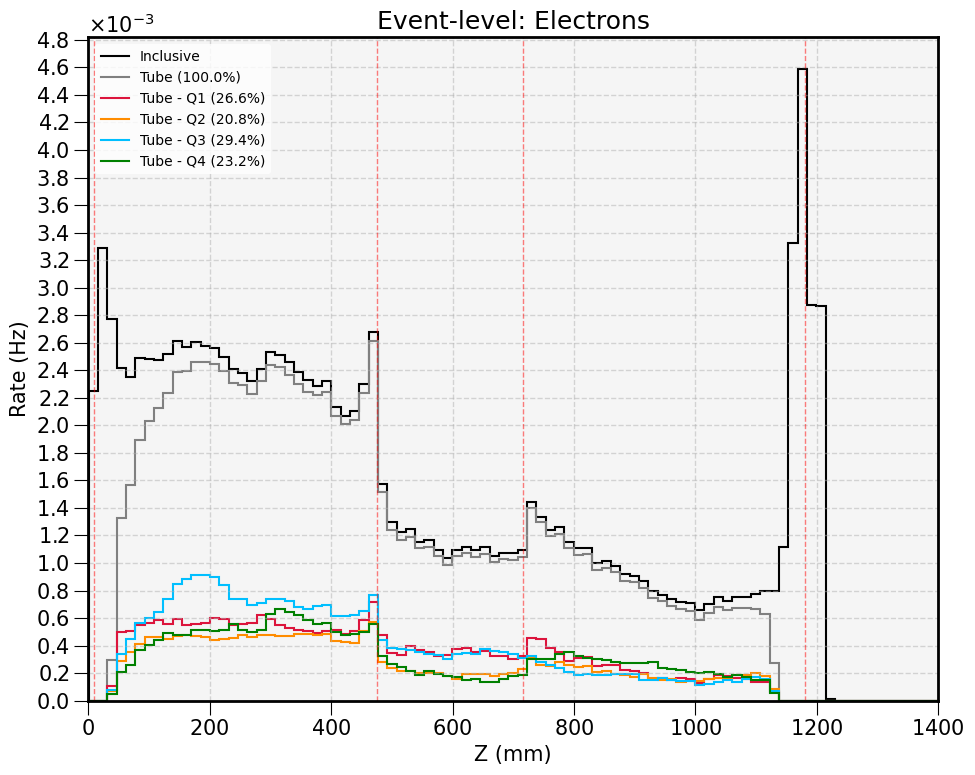

In [73]:
# ----- Plotting ----- #
for task in plot_tasks:

    data  = task['data']
    label = task['label']
    color = pt.hist_colors[task['color_idx'] % len(pt.hist_colors)]

    # Skip if the data for this task is empty
    if data.empty:
        continue

    # Histogram: normalized by corrected DAQ data taking time
    Z_counts, _ = np.histogram(data['Z'], bins=Z_edges)
    Z_rate = Z_counts / DAQ_time
    
    # Event counter + label formatting
    total_events = data['global_id'].nunique()
    if label == 'Inclusive':
        full_label = label
    else:
        full_label = f"{label} ({total_events / total_tube_events:.1%})"

    plt.stairs(Z_rate, Z_edges, label=full_label, fill=False, lw=1.5, ec=color)

# ----- Styling ----- #
plt.xlabel('Z (mm)')
plt.xlim(0, 1400)
plt.ylabel('Rate (Hz)')
# plt.ylim(1e-5, 1e-2)
# plt.yscale('log')
plt.gca().yaxis.set_major_locator(plt.MaxNLocator(25))
plt.title(f'Event-level: {particle}s')
plt.legend(loc='upper left', fontsize=10)

# Lines of the light tube joints
for joint in TUBE_JOINTS:
    plt.axvline(x=joint, color='red', ls='--', lw=1.0, alpha=0.5)

plt.grid(True)
plt.gca().set_facecolor("whitesmoke")
plt.tight_layout()
plt.show()

--- Pre-calculating global color scale ---
Global maximum rate found: 0.0023 Hz. Using this for all plots.


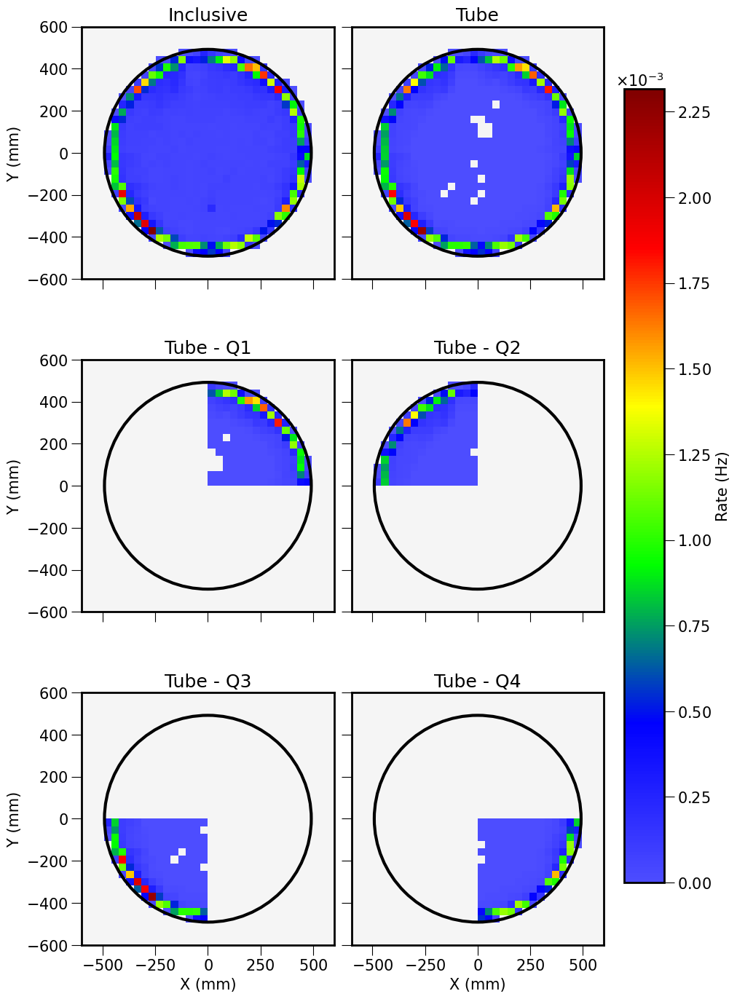

In [64]:
# Global
n_bins = 35

print("--- Pre-calculating global color scale ---")
vmax_global = 0

for task in plot_tasks:

    data = task['data']
    if data.empty:
        continue

    # Calculate the rate map just to find its maximum value
    XY_hit_map, _, _ = pt.mapping(data['X'], data['Y'], xy_bins=n_bins, pos=True)
    XY_rate = XY_hit_map / DAQ_time
    
    # Update the global maximum if the current map's max is higher
    current_max = np.max(XY_rate)
    if current_max > vmax_global:
        vmax_global = current_max

print(f"Global maximum rate found: {vmax_global:.4f} Hz. Using this for all plots.")

# ----- Plotting ----- #
fig, axs = plt.subplots(3, 2, figsize=(10, 14), sharex=True, sharey=True, constrained_layout=True)
axs_flat = axs.flatten()
im = None       # This variable will hold the object from the last plot, needed for the colorbar
for i, task in enumerate(plot_tasks):

    # Check if we have an axis for this task
    if i >= len(axs_flat):
        print(f"Warning: More plot tasks ({len(plot_tasks)}) than available subplots ({len(axs_flat)}). Skipping remaining tasks.")
        break

    ax = axs_flat[i]
    data  = task['data']
    label = task['label']
    color = pt.hist_colors[task['color_idx'] % len(pt.hist_colors)]

    # Skip if the data for this task is empty
    if data.empty:
        ax.text(0.5, 0.5, 'No Data', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(label)
        continue

    # 2D histogram: normalized by corrected DAQ data taking time
    XY_hit_map, ex, ey = pt.mapping(data['X'], data['Y'], xy_bins=n_bins, pos=True)
    XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
    XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

    im = ax.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto', vmin=0, vmax=vmax_global)
    ax.set_title(f'{label}')
    ax.add_patch(pt.plot_circle(pt.N100_rad))
    ax.set_aspect('equal', adjustable='box')
    ax.set_facecolor("whitesmoke")

# --- Hide any unused subplots ---
# If you have 5 tasks but 6 subplots, this hides the last empty one.
for i in range(len(plot_tasks), len(axs_flat)):
    axs_flat[i].set_visible(False)

# --- Add shared labels ---
# Only add labels to the outer plots to avoid clutter
for ax in axs[:, 0]: # Left column
    ax.set_ylabel('Y (mm)')
for ax in axs[-1, :]: # Bottom row
    ax.set_xlabel('X (mm)')

# --- Add the single, shared colorbar ---
if im:
    # Create the colorbar on the right side of the figure
    # `ax=axs.ravel().tolist()` tells the colorbar to "borrow" space from all subplots
    cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.8, label='Rate (Hz)', pad=0.02)
    
    # Set the number of ticks on the colorbar
    tick_locator = mticker.MaxNLocator(nbins=10)
    cbar.locator = tick_locator
    cbar.update_ticks()
    cbar.formatter.set_powerlimits((-3, 3))

# fig.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

## Cathode

### Z Distribution

#### Event-level

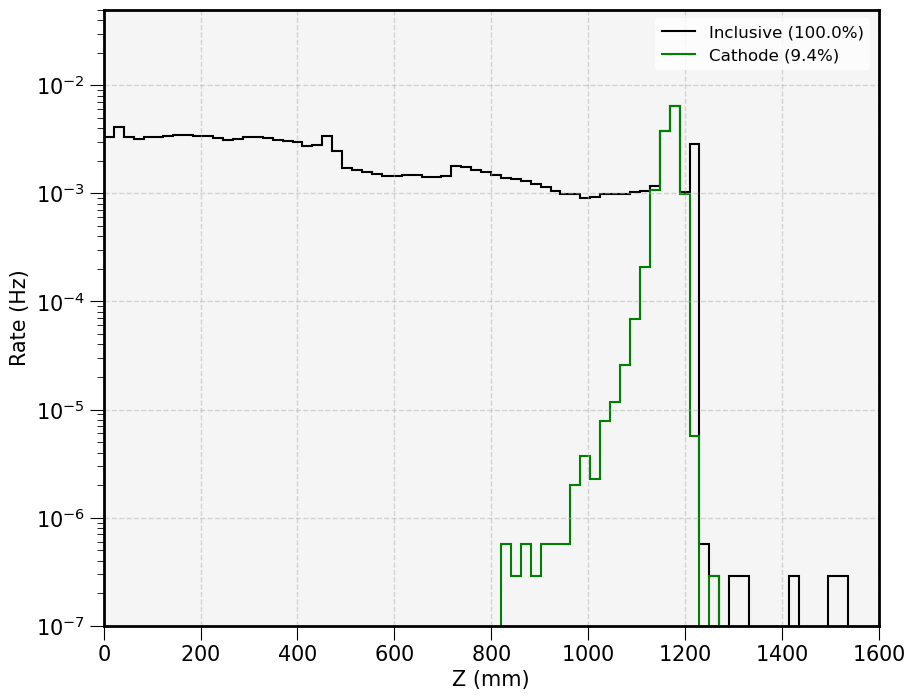

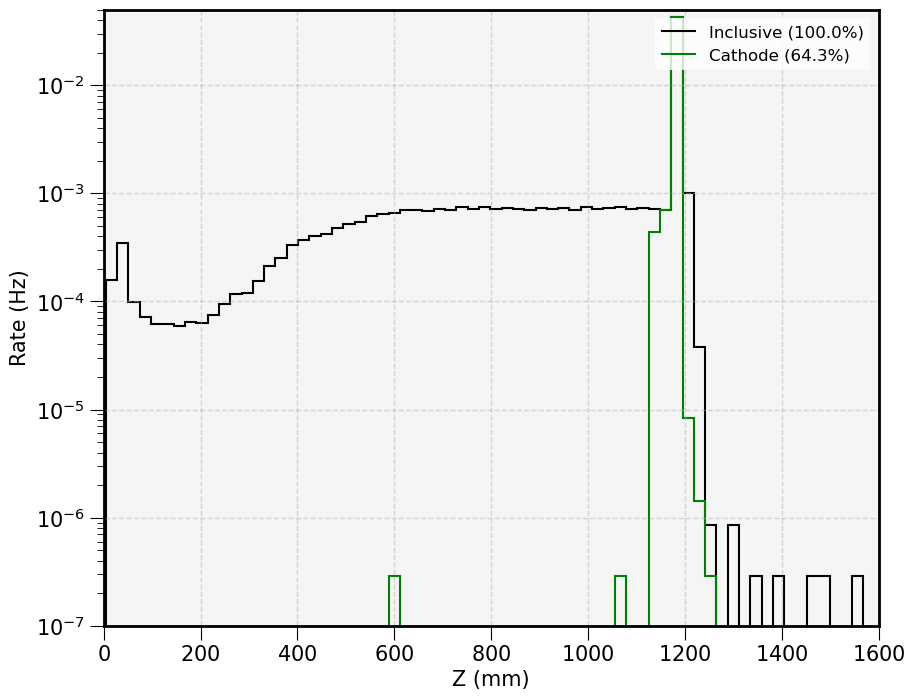

In [49]:
# Global
n_bins = 75

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        evts_all = 0
        rate_all = 0

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']
        _, Z_edges = np.histogram(data_all['Z'], bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Cathode']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Event'][particle][region]

            # Variables
            Z = data['Z']

            # Histogram: normalized by corrected DAQ data taking time
            Z_counts, _ = np.histogram(Z, bins=Z_edges)
            Z_rate = Z_counts / DAQ_time

            # Events and rate counter
            if region == 'Inclusive':
                evts_all = data.global_id.nunique()
                rate_all = Z_rate.sum()

            # ----- Plotting ----- #
            plt.stairs(Z_rate, Z_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.1%})', 
                       fill=False, lw=1.5, ec=pt.hist_colors[k*4 % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel('Z (mm)')
        plt.xlim(0, 1600)
        plt.ylabel('Rate (Hz)')
        plt.ylim(1e-7, 5e-2)
        plt.yscale('log')
        # plt.title(f'Event-level: {particle}s')
        plt.legend(fontsize=12)

        plt.grid(True)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

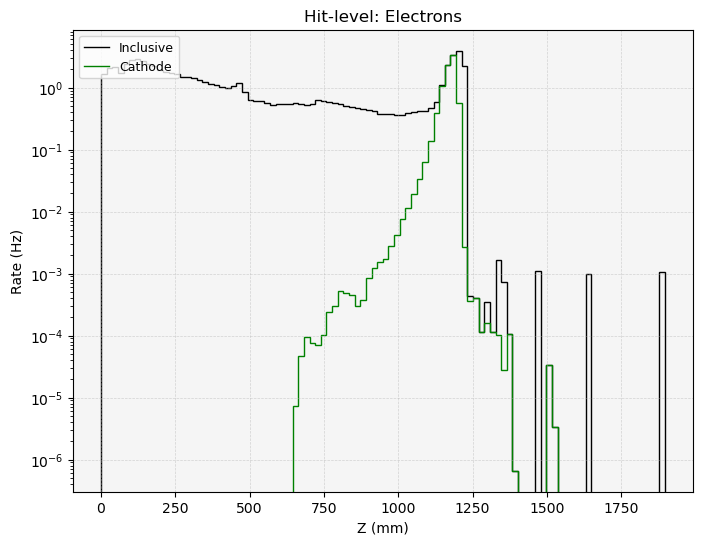

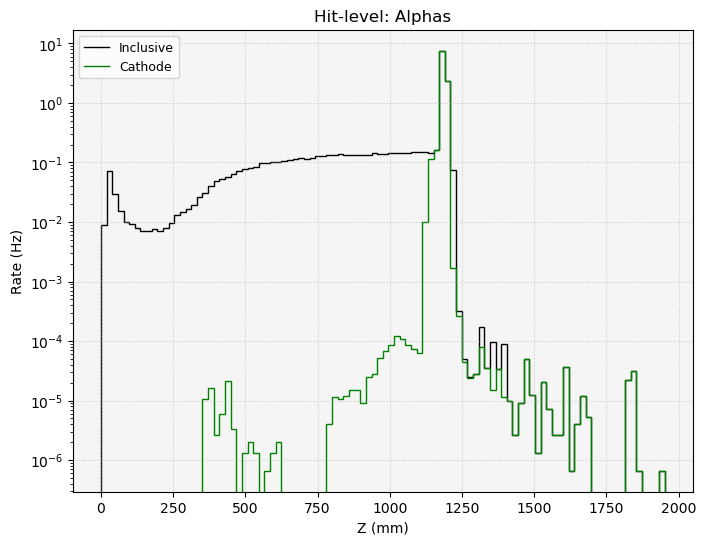

In [ ]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        plt.figure(figsize=(8, 6))

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Sophronia'][particle]['Inclusive']
        _, Z_edges = np.histogram(data_all['Z'], bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Cathode']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Sophronia'][particle][region]

            # Variables
            Z = data['Z']

            # Histogram: normalized by corrected DAQ data taking time
            Z_counts, _ = np.histogram(Z, bins=Z_edges)
            Z_rate = Z_counts / DAQ_time

            # ----- Plotting ----- #
            plt.stairs(Z_rate, Z_edges, label=f'{region}', 
                       fill=False, lw=1.0, ec=pt.hist_colors[k*4 % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel('Z (mm)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        plt.title(f'Hit-level: {particle}s')
        plt.legend(loc='upper left', fontsize=9)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

### XY Map

#### Event-level

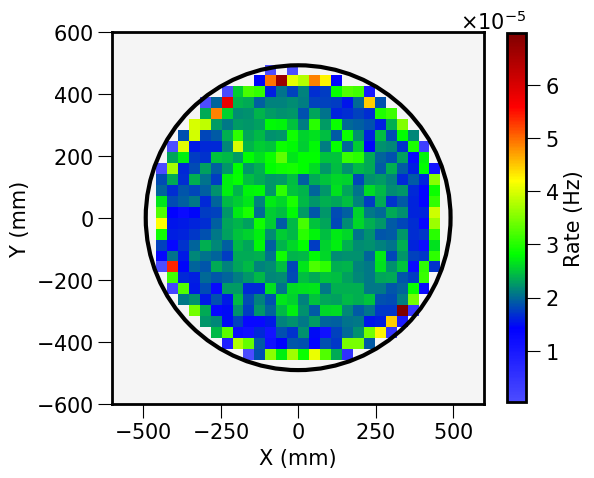

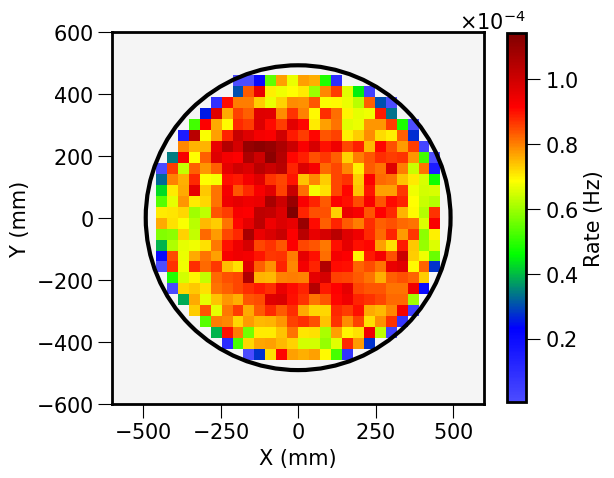

In [72]:
# Global
n_bins = 35

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        # Dataframe
        data = SEL_DATA[condition_flag]['Event'][particle]['Cathode']

        # Variables
        X = data['X']
        Y = data['Y']

        # 2D histogram: normalized by corrected DAQ data taking time
        XY_hit_map, ex, ey = pt.mapping(X, Y, xy_bins=n_bins, pos=True)
        XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
        XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

        # ----- Plotting ----- #
        plt.figure(figsize=(6, 6))
        im = plt.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto')
        cbar = plt.colorbar(im, label='Rate (Hz)', shrink=0.80)
        cbar.formatter.set_powerlimits((-3, 3))
        plt.xlabel('X (mm)')
        plt.ylabel('Y (mm)')
        # plt.title(f'Event-level: {particle}s @ Cathode')

        plt.gca().add_patch(pt.plot_circle(pt.N100_rad, LINESTYLE='-'))
        plt.gca().set_aspect('equal', adjustable='box')
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

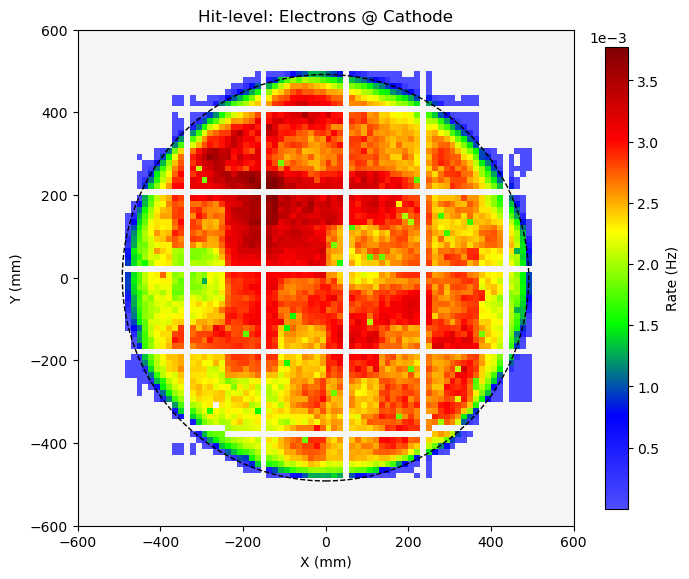

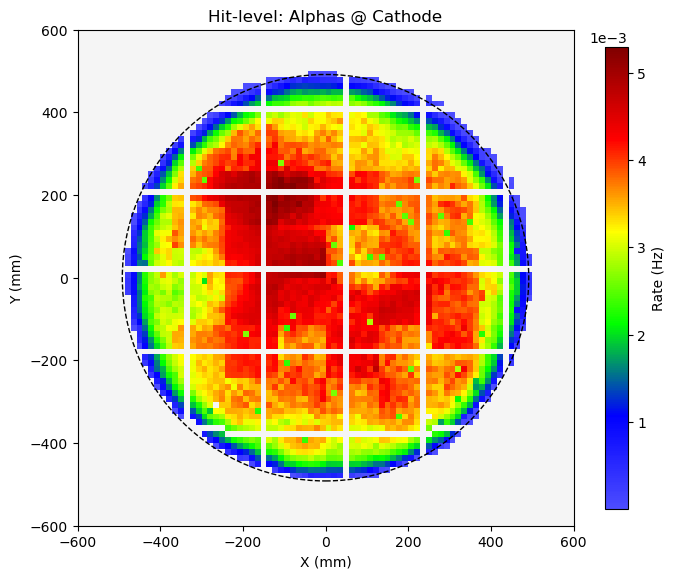

In [ ]:
# Global
n_bins = 85

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        # Dataframe
        data = SEL_DATA[condition_flag]['Sophronia'][particle]['Cathode']

        # Variables
        X = data['X']
        Y = data['Y']

        # 2D histogram: normalized by corrected DAQ data taking time
        XY_hit_map, ex, ey = pt.mapping(X, Y, xy_bins=n_bins, pos=True)
        XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
        XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

        # ----- Plotting ----- #
        plt.figure(figsize=(5, 5))
        im = plt.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto')
        cbar = plt.colorbar(im, label='Rate (Hz)', shrink=0.75)
        cbar.formatter.set_powerlimits((-3, 3))
        plt.xlabel('X (mm)')
        plt.ylabel('Y (mm)')
        plt.title(f'Hit-level: {particle}s @ Cathode')

        plt.gca().add_patch(pt.plot_circle(pt.N100_rad))
        plt.gca().set_aspect('equal', adjustable='box')
        plt.gca().set_facecolor("whitesmoke")
        plt.tight_layout()
        plt.show()

### $\phi$ Distribution

#### Event-level

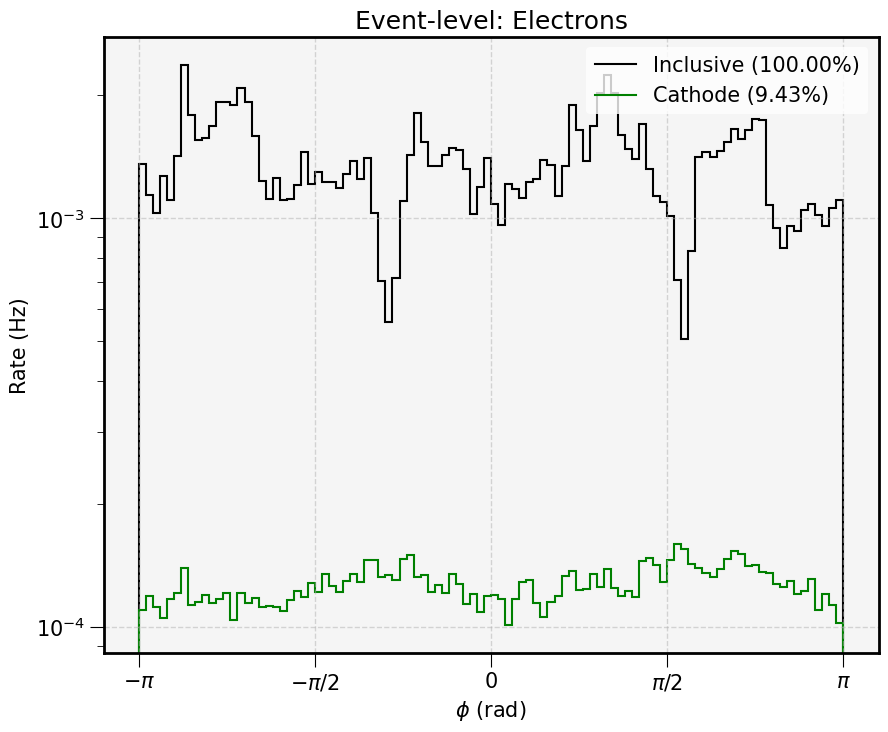

In [22]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        evts_all = 0

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']
        _, phi_edges = np.histogram(np.arctan2(data_all['Y'], data_all['X']), bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Cathode']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Event'][particle][region]

            # Variables
            X = data['X']
            Y = data['Y']
            phi = np.arctan2(Y, X)

            # Histogram: normalized by corrected DAQ data taking time
            phi_counts, _ = np.histogram(phi, bins=phi_edges)
            phi_rate = phi_counts / DAQ_time

            # Events and rate counter
            if region == 'Inclusive':
                evts_all = data.global_id.nunique()
                rate_all = phi_rate.sum()

            # ----- Plotting ----- #
            plt.stairs(phi_rate, phi_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.2%})', 
                       fill=False, lw=1.5, ec=pt.hist_colors[k*4 % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'$\phi$ (rad)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Event-level: {particle}s')
        plt.legend()

        # Set x-ticks as multiples of π
        ticks = np.arange(-np.pi, np.pi + 0.1, np.pi / 2)
        tick_labels = [r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$']
        plt.xticks(ticks, tick_labels)

        plt.grid(True)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

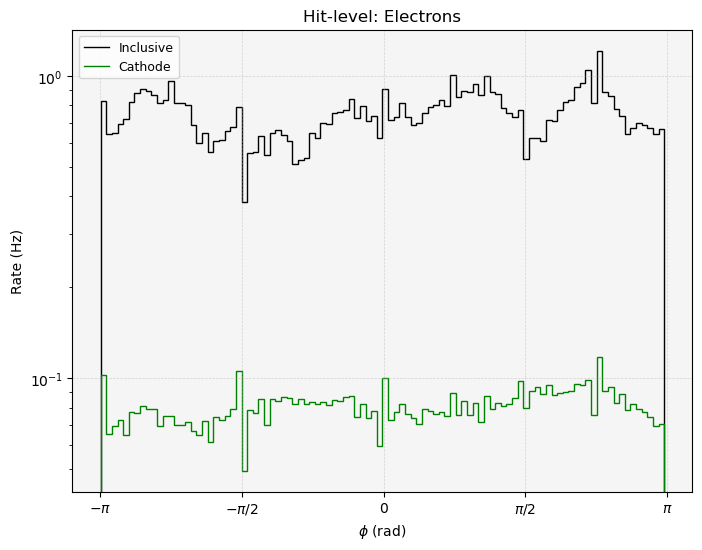

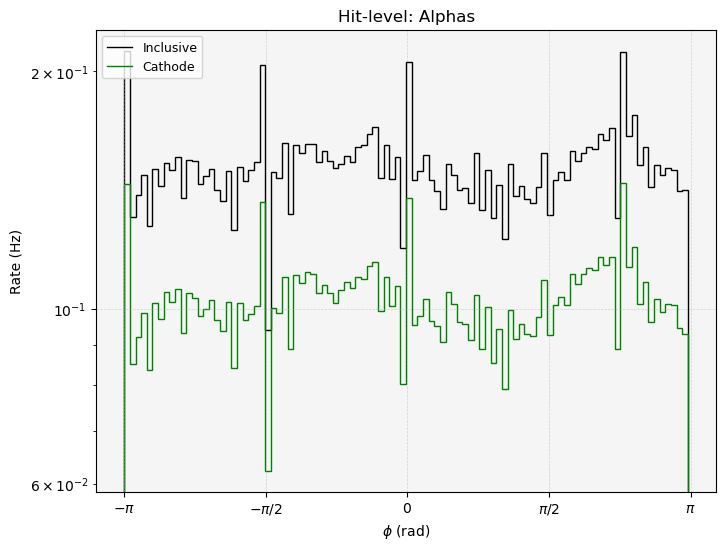

In [65]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = sel_data[condition_flag]['DAQ_time']

    for particle in particles:

        plt.figure(figsize=(8, 6))

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = sel_data[condition_flag]['Sophronia'][particle]['Inclusive']
        _, phi_edges = np.histogram(np.arctan2(data_all['Y'], data_all['X']), bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Cathode']):

            # Dataframe
            data = sel_data[condition_flag]['Sophronia'][particle][region]

            # Variables
            X = data['X']
            Y = data['Y']
            phi = np.arctan2(Y, X)

            # Histogram: normalized by corrected DAQ data taking time
            phi_counts, _ = np.histogram(phi, bins=phi_edges)
            phi_rate = phi_counts / DAQ_time

            # ----- Plotting ----- #
            plt.stairs(phi_rate, phi_edges, label=f'{region}', 
                       fill=False, lw=1.0, ec=pt.hist_colors[k*4 % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'$\phi$ (rad)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Hit-level: {particle}s')
        plt.legend(loc='upper left', fontsize=9)

        # Set x-ticks as multiples of π
        ticks = np.arange(-np.pi, np.pi + 0.1, np.pi / 2)
        tick_labels = [r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$']
        plt.xticks(ticks, tick_labels)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

### $R^{2}$ Distribution

#### Event-level

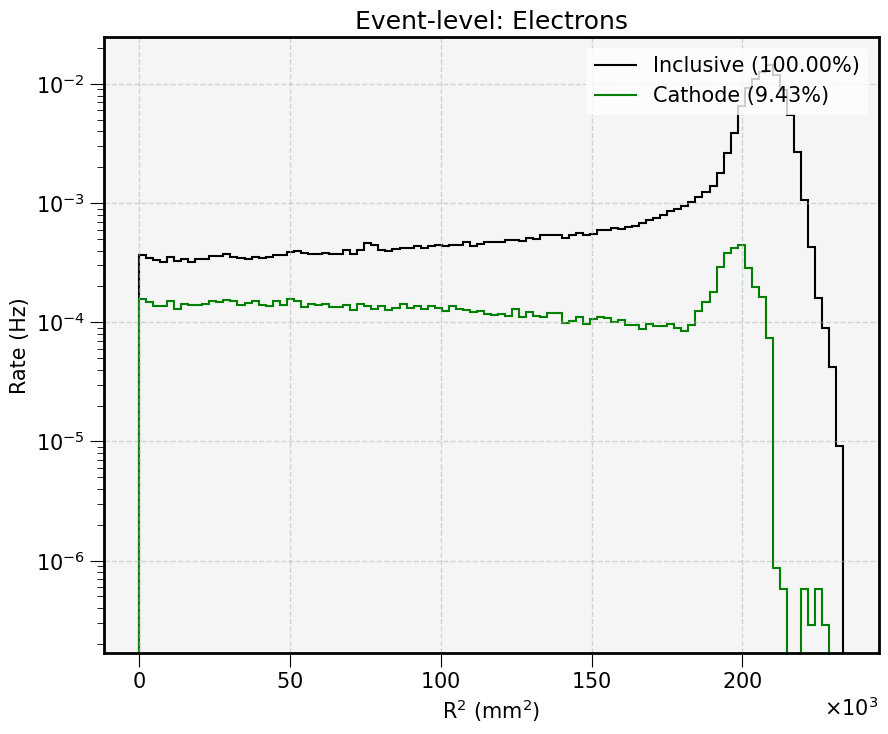

In [23]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        evts_all = 0

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']
        _, R2_edges = np.histogram(data_all['X']**2 + data_all['Y']**2, bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Cathode']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Event'][particle][region]

            # Variables
            R2 = data['X']**2 + data['Y']**2

            # Histogram: normalized by corrected DAQ data taking time
            R2_counts, _ = np.histogram(R2, bins=R2_edges)
            R2_rate = R2_counts / DAQ_time

            # Events and rate counter
            if region == 'Inclusive':
                evts_all = data.global_id.nunique()

            # ----- Plotting ----- #
            plt.stairs(R2_rate, R2_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.2%})', 
                       fill=False, lw=1.5, ec=pt.hist_colors[k*4 % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'R$^{2}$ (mm$^{2}$)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        plt.ticklabel_format(axis='x', style='sci', scilimits=(3, 3))
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Event-level: {particle}s')
        plt.legend()

        # Radial limit
        # plt.axvline(x=pt.N100_rad**2, c='grey', ls='--', lw=1)

        plt.grid(True)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

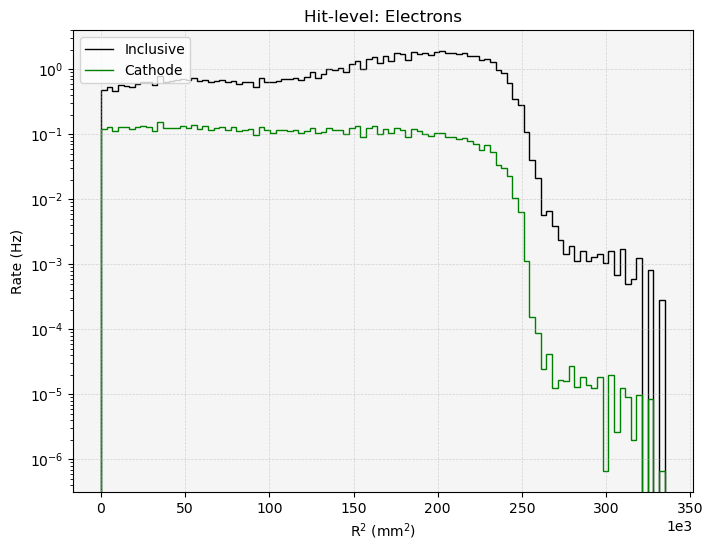

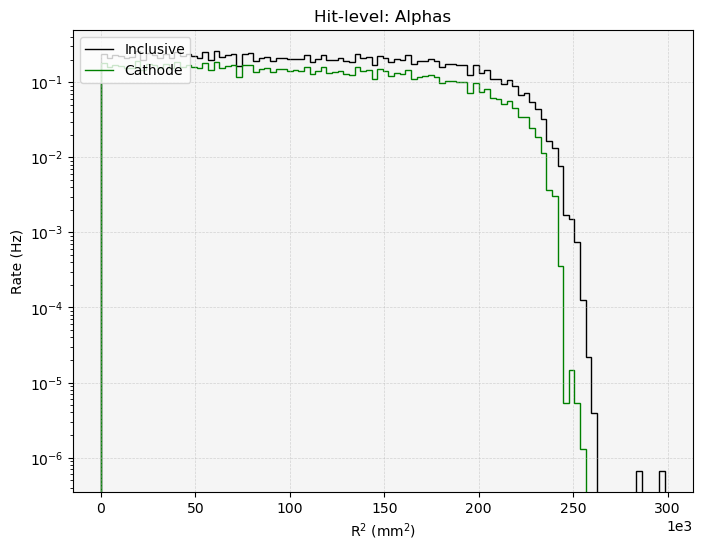

In [67]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = sel_data[condition_flag]['DAQ_time']

    for particle in particles:

        plt.figure(figsize=(8, 6))

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = sel_data[condition_flag]['Sophronia'][particle]['Inclusive']
        _, R2_edges = np.histogram(data_all['X']**2 + data_all['Y']**2, bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Cathode']):

            # Dataframe
            data = sel_data[condition_flag]['Sophronia'][particle][region]

            # Variables
            R2 = data['X']**2 + data['Y']**2

            # Histogram: normalized by corrected DAQ data taking time
            R2_counts, _ = np.histogram(R2, bins=R2_edges)
            R2_rate = R2_counts / DAQ_time

            # ----- Plotting ----- #
            plt.stairs(R2_rate, R2_edges, label=f'{region}', 
                       fill=False, lw=1.0, ec=pt.hist_colors[k*4 % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'R$^{2}$ (mm$^{2}$)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        plt.ticklabel_format(axis='x', style='sci', scilimits=(3, 3))
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Hit-level: {particle}s')
        plt.legend(loc='upper left', fontsize=10)

        # Radial limit
        # plt.axvline(x=pt.N100_rad**2, c='grey', ls='--', lw=1)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

## Anode

### Z Distribution

#### Event-level

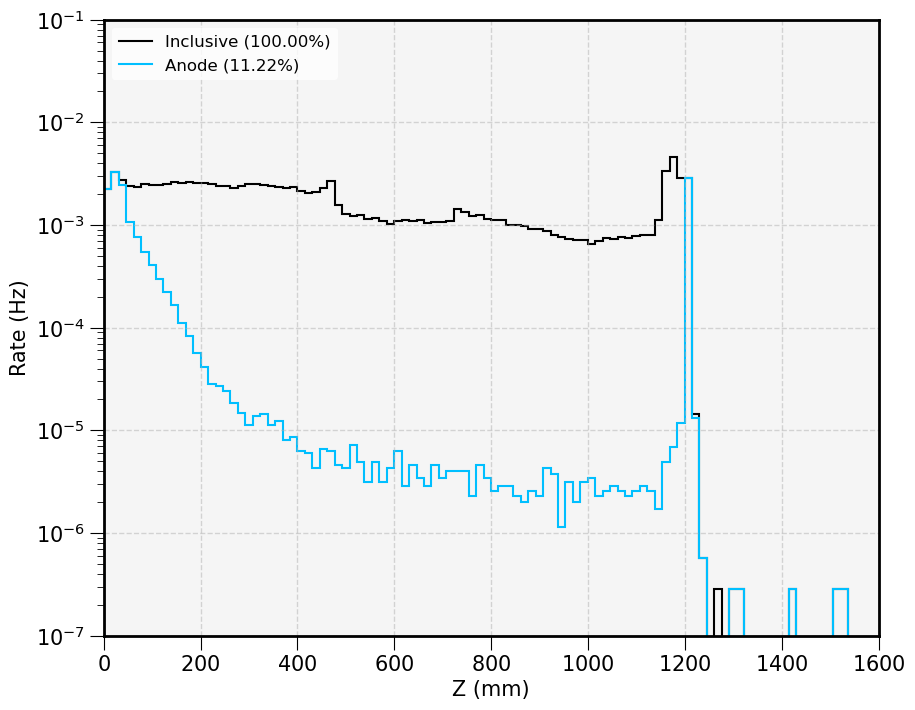

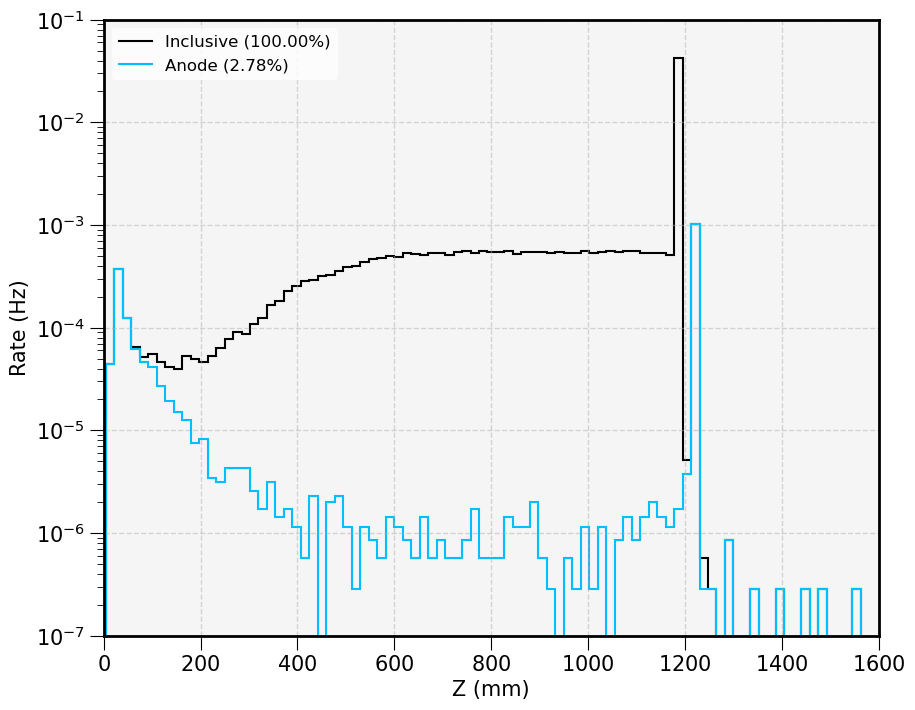

In [94]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        evts_all = 0
        rate_all = 0

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Event'][particle]['Inclusive']
        _, Z_edges = np.histogram(data_all['Z'], bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Anode']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Event'][particle][region]

            # Variables
            Z = data['Z']

            # Histogram: normalized by corrected DAQ data taking time
            Z_counts, _ = np.histogram(Z, bins=Z_edges)
            Z_rate = Z_counts / DAQ_time

            # Events and rate counter
            if region == 'Inclusive':
                evts_all = data.global_id.nunique()

            # ----- Plotting ----- #
            plt.stairs(Z_rate, Z_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.2%})', 
                       fill=False, lw=1.5, ec=pt.hist_colors[k*3 % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel('Z (mm)')
        plt.xlim(0, 1600)
        plt.ylabel('Rate (Hz)')
        plt.ylim(1e-7, 1e-1)
        plt.yscale('log')
        # plt.title(f'Event-level: {particle}s')
        plt.legend(loc='upper left', fontsize=12)

        plt.grid(True)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

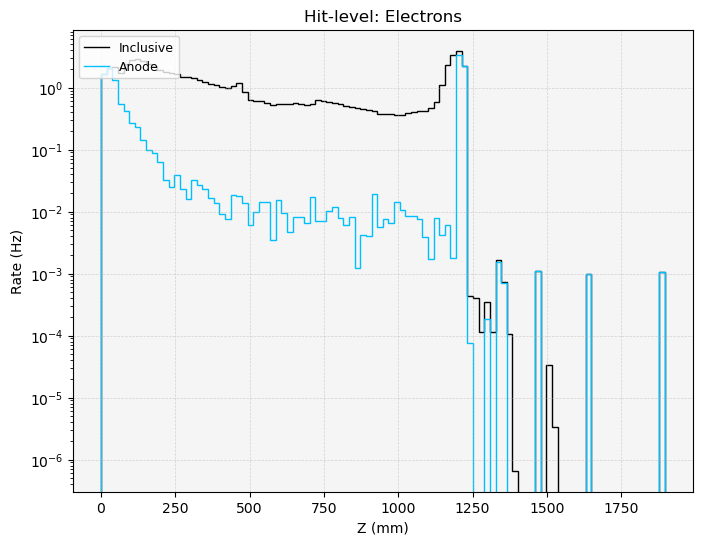

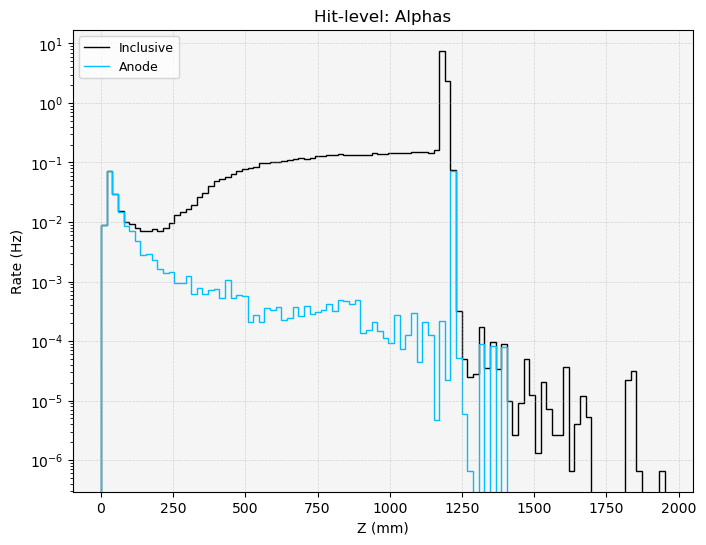

In [ ]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        plt.figure(figsize=(8, 6))

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = SEL_DATA[condition_flag]['Sophronia'][particle]['Inclusive']
        _, Z_edges = np.histogram(data_all['Z'], bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Anode']):

            # Dataframe
            data = SEL_DATA[condition_flag]['Sophronia'][particle][region]

            # Variables
            Z = data['Z']

            # Histogram: normalized by corrected DAQ data taking time
            Z_counts, _ = np.histogram(Z, bins=Z_edges)
            Z_rate = Z_counts / DAQ_time

            # ----- Plotting ----- #
            plt.stairs(Z_rate, Z_edges, label=f'{region}', 
                       fill=False, lw=1.0, ec=pt.hist_colors[3*k % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel('Z (mm)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        plt.title(f'Hit-level: {particle}s')
        plt.legend(loc='upper left', fontsize=9)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

### XY Map

#### Event-level

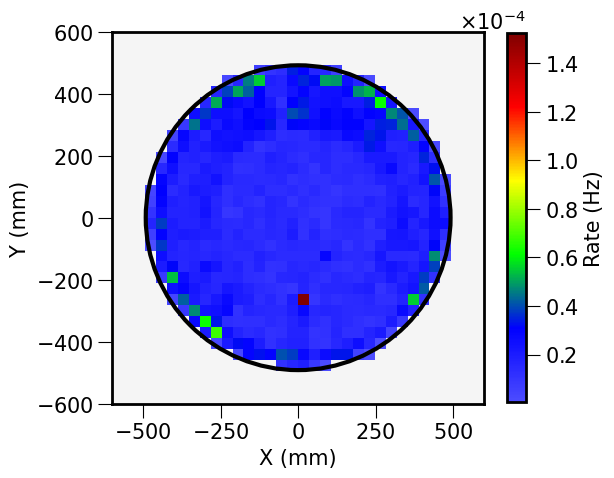

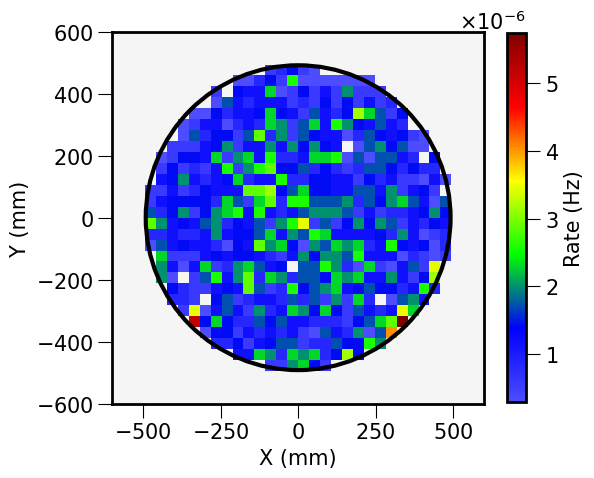

In [61]:
# Global
n_bins = 35

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    for particle in PARTICLES:

        # Dataframe
        data = SEL_DATA[condition_flag]['Event'][particle]['Anode']

        # Variables
        X = data['X']
        Y = data['Y']
        Z = data['Z']

        # Masking
        Z_mask = Z <= 400
        X = X[Z_mask]
        Y = Y[Z_mask]

        # 2D histogram: normalized by corrected DAQ data taking time
        XY_hit_map, ex, ey = pt.mapping(X, Y, xy_bins=n_bins, pos=True)
        XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
        XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

        # ----- Plotting ----- #
        plt.figure(figsize=(6, 6))
        im = plt.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto')
        cbar = plt.colorbar(im, label='Rate (Hz)', shrink=0.80)
        cbar.formatter.set_powerlimits((-3, 3))
        plt.xlabel('X (mm)')
        plt.ylabel('Y (mm)')
        # plt.title(f'Event-level: {particle}s @ Anode')

        plt.gca().add_patch(pt.plot_circle(pt.N100_rad, LINESTYLE='-'))
        plt.gca().set_aspect('equal', adjustable='box')
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

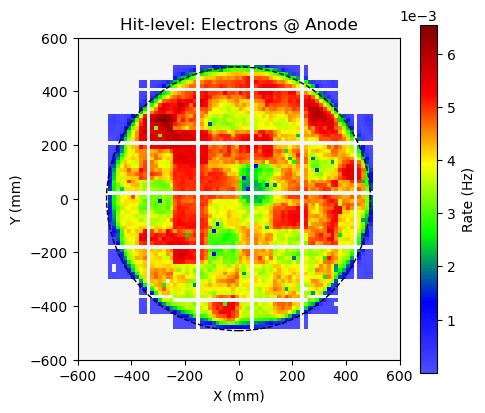

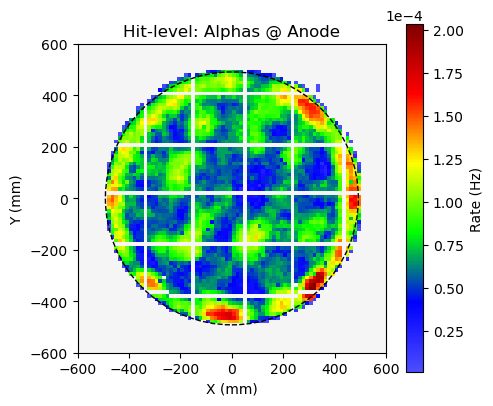

In [72]:
# Global
n_bins = 85

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = sel_data[condition_flag]['DAQ_time']

    for particle in particles:

        # Dataframe
        data = sel_data[condition_flag]['Sophronia'][particle]['Anode']

        # Variables
        X = data['X']
        Y = data['Y']

        # 2D histogram: normalized by corrected DAQ data taking time
        XY_hit_map, ex, ey = pt.mapping(X, Y, xy_bins=n_bins, pos=True)
        XY_rate            = XY_hit_map / DAQ_time                          # Normalized to rate      
        XY_rate            = np.ma.masked_where(XY_rate == 0, XY_rate)      # Zero values masked

        # ----- Plotting ----- #
        plt.figure(figsize=(5, 5))
        im = plt.pcolormesh(ex, ey, XY_rate.T, cmap=pt.custom_hsv, shading='auto')
        cbar = plt.colorbar(im, label='Rate (Hz)', shrink=0.75)
        cbar.formatter.set_powerlimits((-3, 3))
        plt.xlabel('X (mm)')
        plt.ylabel('Y (mm)')
        plt.title(f'Hit-level: {particle}s @ Anode')

        plt.gca().add_patch(pt.plot_circle(pt.N100_rad))
        plt.gca().set_aspect('equal', adjustable='box')
        plt.gca().set_facecolor("whitesmoke")
        plt.tight_layout()
        plt.show()

### $\phi$ Distribution

#### Event-level

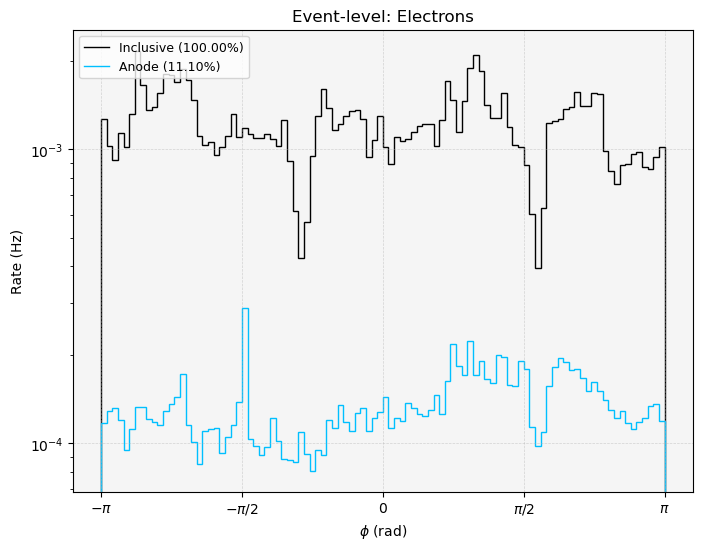

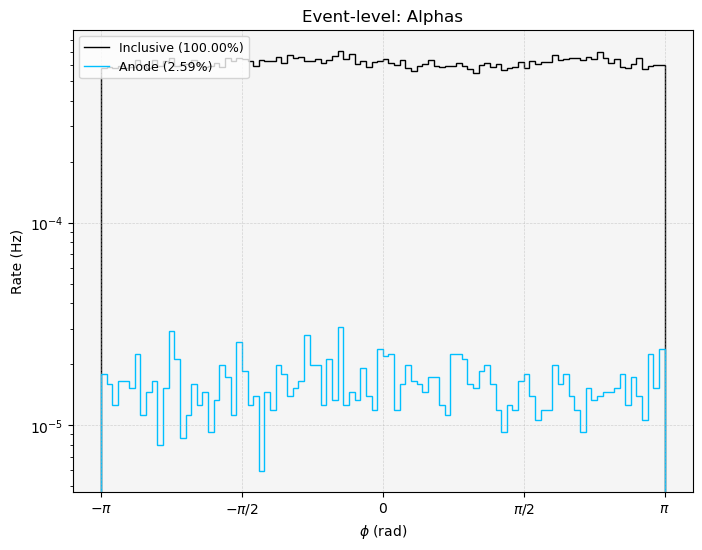

In [73]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = sel_data[condition_flag]['DAQ_time']

    for particle in particles:

        plt.figure(figsize=(8, 6))
        evts_all = 0

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = sel_data[condition_flag]['Event'][particle]['Inclusive']
        _, phi_edges = np.histogram(np.arctan2(data_all['Y'], data_all['X']), bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Anode']):

            # Dataframe
            data = sel_data[condition_flag]['Event'][particle][region]

            # Variables
            X = data['X']
            Y = data['Y']
            phi = np.arctan2(Y, X)

            # Histogram: normalized by corrected DAQ data taking time
            phi_counts, _ = np.histogram(phi, bins=phi_edges)
            phi_rate = phi_counts / DAQ_time

            # Events and rate counter
            if region == 'Inclusive':
                evts_all = data.global_id.nunique()

            # ----- Plotting ----- #
            plt.stairs(phi_rate, phi_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.2%})', 
                       fill=False, lw=1.0, ec=pt.hist_colors[3*k % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'$\phi$ (rad)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Event-level: {particle}s')
        plt.legend(loc='upper left', fontsize=9)

        # Set x-ticks as multiples of π
        ticks = np.arange(-np.pi, np.pi + 0.1, np.pi / 2)
        tick_labels = [r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$']
        plt.xticks(ticks, tick_labels)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

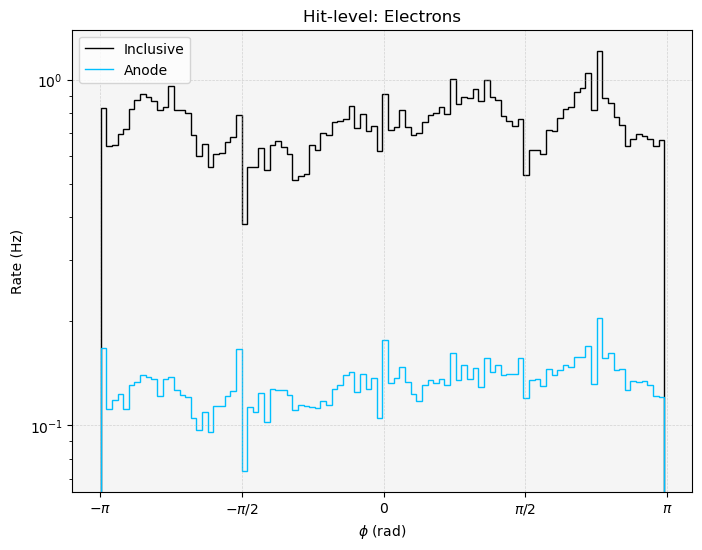

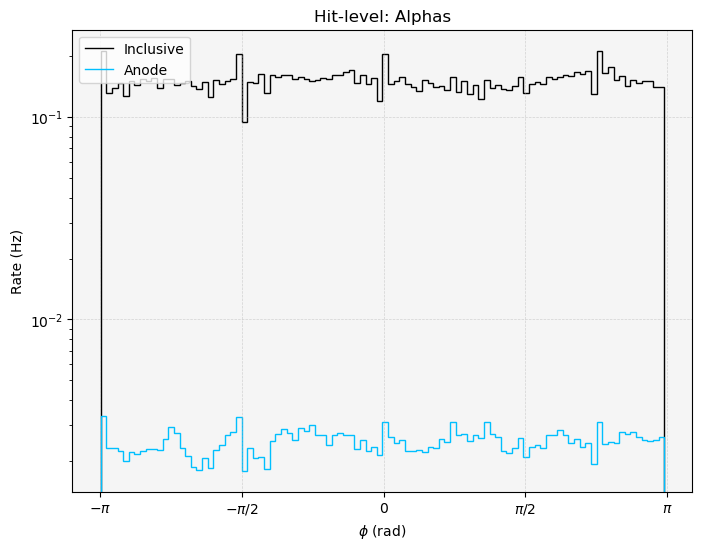

In [74]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = sel_data[condition_flag]['DAQ_time']

    for particle in particles:

        plt.figure(figsize=(8, 6))

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = sel_data[condition_flag]['Sophronia'][particle]['Inclusive']
        _, phi_edges = np.histogram(np.arctan2(data_all['Y'], data_all['X']), bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Anode']):

            # Dataframe
            data = sel_data[condition_flag]['Sophronia'][particle][region]

            # Variables
            X = data['X']
            Y = data['Y']
            phi = np.arctan2(Y, X)

            # Histogram: normalized by corrected DAQ data taking time
            phi_counts, _ = np.histogram(phi, bins=phi_edges)
            phi_rate = phi_counts / DAQ_time

            # ----- Plotting ----- #
            plt.stairs(phi_rate, phi_edges, label=f'{region}', 
                       fill=False, lw=1.0, ec=pt.hist_colors[3*k % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'$\phi$ (rad)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Hit-level: {particle}s')
        plt.legend(loc='upper left', fontsize=10)

        # Set x-ticks as multiples of π
        ticks = np.arange(-np.pi, np.pi + 0.1, np.pi / 2)
        tick_labels = [r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$']
        plt.xticks(ticks, tick_labels)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

### $R^{2}$ Distribution

#### Event-level

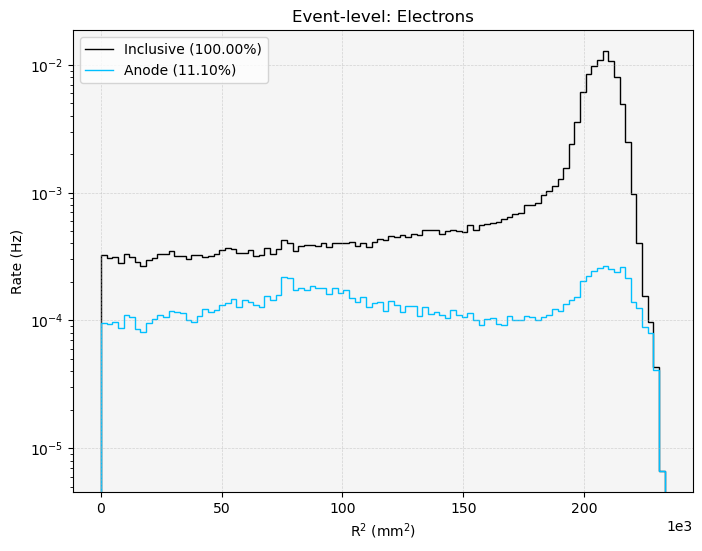

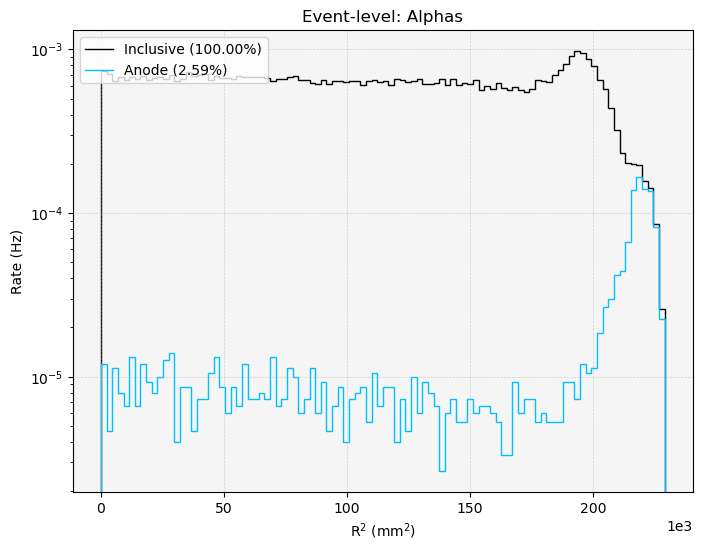

In [75]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = sel_data[condition_flag]['DAQ_time']

    for particle in particles:

        plt.figure(figsize=(8, 6))
        evts_all = 0

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = sel_data[condition_flag]['Event'][particle]['Inclusive']
        _, R2_edges = np.histogram(data_all['X']**2 + data_all['Y']**2, bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Anode']):

            # Dataframe
            data = sel_data[condition_flag]['Event'][particle][region]

            # Variables
            R2 = data['X']**2 + data['Y']**2

            # Histogram: normalized by corrected DAQ data taking time
            R2_counts, _ = np.histogram(R2, bins=R2_edges)
            R2_rate = R2_counts / DAQ_time

            # Events and rate counter
            if region == 'Inclusive':
                evts_all = data.global_id.nunique()

            # ----- Plotting ----- #
            plt.stairs(R2_rate, R2_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.2%})', 
                       fill=False, lw=1.0, ec=pt.hist_colors[3*k % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'R$^{2}$ (mm$^{2}$)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        plt.ticklabel_format(axis='x', style='sci', scilimits=(3, 3))
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Event-level: {particle}s')
        plt.legend(loc='upper left', fontsize=10)

        # Radial limit
        # plt.axvline(x=pt.N100_rad**2, c='grey', ls='--', lw=1)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

#### Hit-level

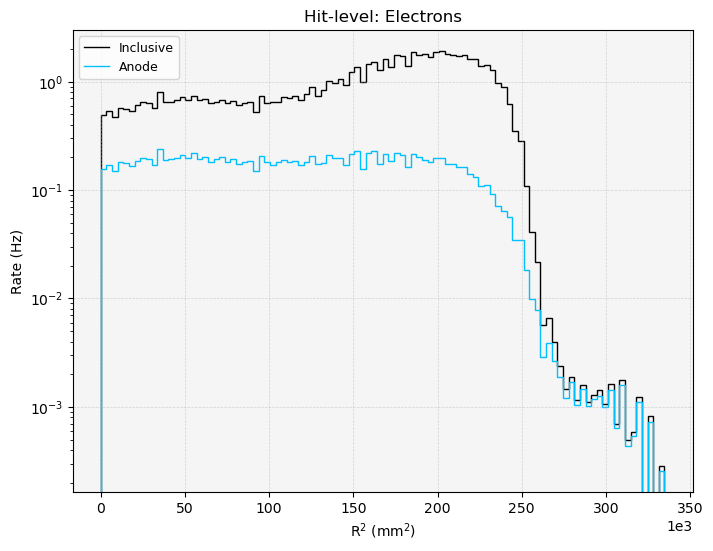

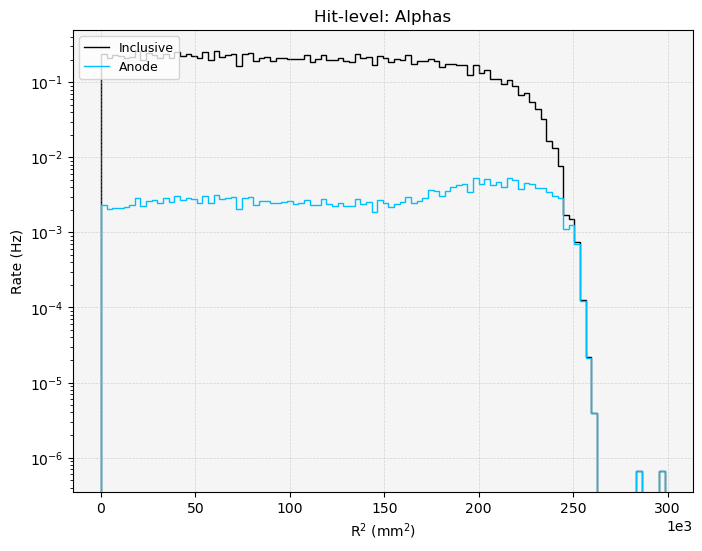

In [76]:
# Global
n_bins = 100

for condition_flag in [CONDITION_FLAG]:

    # Group information
    DAQ_time = sel_data[condition_flag]['DAQ_time']

    for particle in particles:

        plt.figure(figsize=(8, 6))

        # ----- Define the Binning ----- #
        # Use the "Inclusive" region to define the binning
        data_all   = sel_data[condition_flag]['Sophronia'][particle]['Inclusive']
        _, R2_edges = np.histogram(data_all['X']**2 + data_all['Y']**2, bins=n_bins)

        for k, region in enumerate(['Inclusive', 'Anode']):

            # Dataframe
            data = sel_data[condition_flag]['Sophronia'][particle][region]

            # Variables
            R2 = data['X']**2 + data['Y']**2

            # Histogram: normalized by corrected DAQ data taking time
            R2_counts, _ = np.histogram(R2, bins=R2_edges)
            R2_rate = R2_counts / DAQ_time

            # ----- Plotting ----- #
            plt.stairs(R2_rate, R2_edges, label=f'{region}', 
                       fill=False, lw=1.0, ec=pt.hist_colors[3*k % len(pt.hist_colors)])

        # ----- Styling ----- #
        plt.xlabel(r'R$^{2}$ (mm$^{2}$)')
        plt.ylabel('Rate (Hz)')
        plt.yscale('log')
        plt.ticklabel_format(axis='x', style='sci', scilimits=(3, 3))
        # plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
        plt.title(f'Hit-level: {particle}s')
        plt.legend(loc='upper left', fontsize=9)

        # Radial limit
        # plt.axvline(x=pt.N100_rad**2, c='grey', ls='--', lw=1)

        plt.grid(True, ls='--', lw=0.5, alpha=0.5)
        plt.gca().set_facecolor("whitesmoke")
        plt.show()

## Comparison Plots: $E_{\text{evt}}$ / $\bar{Z}$

This is always at _event-level_.

### Effects of Lead Castle

Condition 0: Rate = 0.6455 ± 0.0028 Hz = 51453 events / 80061.42 s
Condition 3: Rate = 0.0236 ± 0.0001 Hz = 28981 events / 1233555.38 s


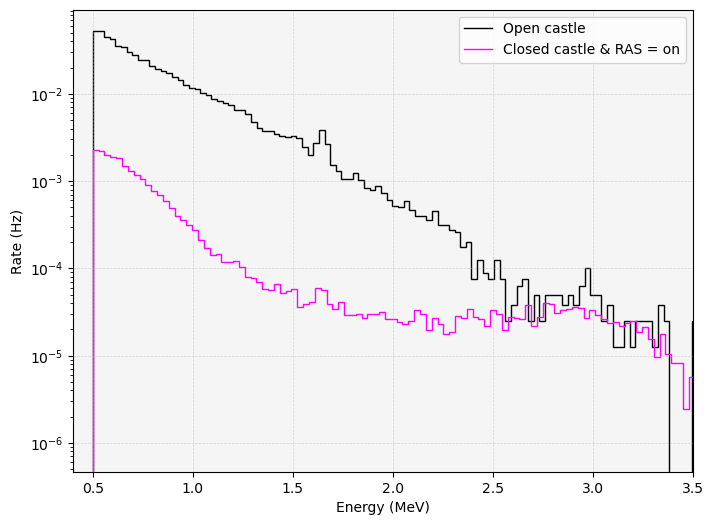

In [ ]:
# Global
n_bins = 250
x_min = 0.4; x_max = 3.5

plt.figure(figsize=(8, 6))

for i, condition_flag in enumerate([0, 3]):

    # Group information
    DAQ_time = sel_data[condition_flag]['DAQ_time']

    # Dataframe
    data = sel_data[condition_flag]['Event']['Electron']['All']

    # Variables
    E_corr = data['E_corr']

    # Histogram: normalized by corrected DAQ data taking time
    E_counts, E_edges = np.histogram(E_corr, bins=n_bins)
    E_rate = E_counts / DAQ_time

    # Statistical error estimation (Poisson uncertainty)
    E_rate_error = np.sqrt(E_counts) / DAQ_time

    # Print rate with statistical error
    total_rate = E_rate.sum()
    total_rate_error = np.sqrt(np.sum(E_rate_error**2))
    print(f"Condition {condition_flag}: Rate = {total_rate:.4f} ± {total_rate_error:.4f} Hz = {data.event.nunique()} events / {DAQ_time:.2f} s")

    # Labeling
    if condition_flag == 0:
        label = 'Open castle'
    elif condition_flag == 3:
        label = 'Closed castle & RAS = on'

    # ----- Plotting ----- #
    plt.stairs(E_rate, E_edges, label=f'{label}', 
               fill=False, lw=1.0, ec=pt.hist_colors[i*6 % len(pt.hist_colors)])
    

# ----- Styling ----- #
plt.xlabel('Energy (MeV)')
plt.xlim(0.4, 3.5)    
plt.ylabel('Rate (Hz)')
plt.yscale('log')
# plt.title(f'Event-level: Electrons')
plt.legend(loc='best', fontsize=10)

plt.grid(True, ls='--', lw=0.5, alpha=0.5)
plt.gca().set_facecolor("whitesmoke")
# plt.savefig('/lustre/ific.uv.es/prj/gl/neutrinos/users/ccortesp/NEXT-100/temp/energy_bckgrnd_OC_CC.pdf')
plt.show()

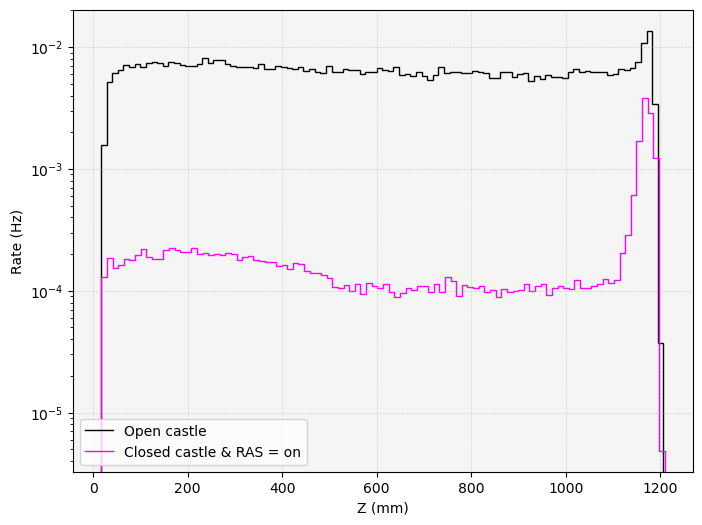

In [15]:
# Global
n_bins = 100
plt.figure(figsize=(8, 6))

for i, condition_flag in enumerate([0, 3]):

    # Group information
    DAQ_time = sel_data[condition_flag]['DAQ_time']

    # Dataframe
    data = sel_data[condition_flag]['Event']['Electron']['All']

    # Variables
    Z = data['Z']

    # Histogram: normalized by corrected DAQ data taking time
    Z_counts, Z_edges = np.histogram(Z, bins=n_bins)
    Z_rate = Z_counts / DAQ_time

    # Labeling
    if condition_flag == 0:
        label = 'Open castle'
    elif condition_flag == 3:
        label = 'Closed castle & RAS = on'

    # ----- Plotting ----- #
    plt.stairs(Z_rate, Z_edges, label=f'{label}', 
               fill=False, lw=1.0, ec=pt.hist_colors[i*6 % len(pt.hist_colors)])
    
# plt.axvline(x=pt.N100_hei, c='grey', ls='--', lw=1.0)        # Longitudinal limit

# ----- Styling ----- #
plt.xlabel('Z (mm)')
plt.ylabel('Rate (Hz)')
plt.yscale('log')
# plt.title(f'Event-level: {particle}s')
plt.legend(loc='lower left', fontsize=10)

plt.grid(True, ls='--', lw=0.5, alpha=0.5)
plt.gca().set_facecolor("whitesmoke")
# plt.savefig('/lustre/ific.uv.es/prj/gl/neutrinos/users/ccortesp/NEXT-100/temp/Z_bckgrnd_OC_CC.pdf')
plt.show()

### Effects of the Fiducial Selection

Here we do some tricky shift to the energy spectrum, cause' we are using $Kr$ energy scale by now.

Center of the DEP bin: 1.670
Shift value: 0.077 MeV
Inclusive: Rate = (113.98 ± 0.18) mHz = 467338 evts / 3483753.91 s
Fiducial: Rate = (2.83 ± 0.03) mHz = 12778 evts / 3483753.91 s


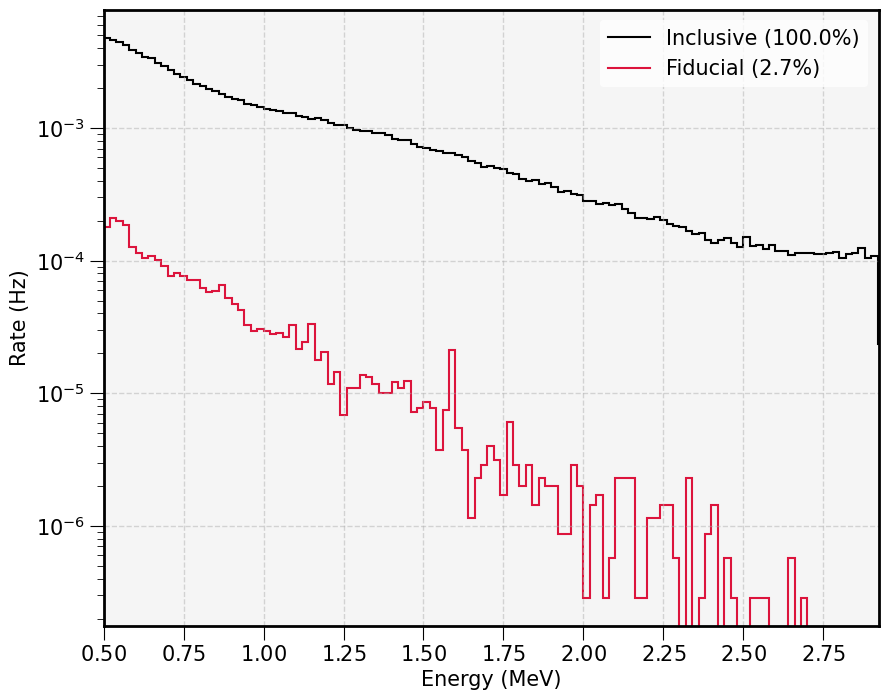

In [28]:
# Global
DEP_VALUE = 1.593       # MeV
bad_value = 0

n_bins = 125
evts_all = 0
rate_all = 0

for condition_flag in [3]:

    # Group information
    DAQ_time = SEL_DATA[condition_flag]['DAQ_time']

    # ----- Define the Binning ----- #
    # Use the "Inclusive" region to define the binning
    data_all   = SEL_DATA[condition_flag]['Event']['Electron']['Inclusive']
    _, E_edges = np.histogram(data_all['E_corr'], bins=n_bins)

    # ----- Shifting the Histogram ----- #
    # Use the "Fiducial" data that includes DEP peak 
    data_fid = SEL_DATA[condition_flag]['Event']['Electron']['Fiducial']
    E_corr_fid = data_fid['E_corr']
    E_counts_fid, _ = np.histogram(E_corr_fid, bins=E_edges)

    # Mask around DEP peak
    mask = (E_edges[:-1] >= 1.55) & (E_edges[:-1] <= 1.75)  
    bin_centers = (E_edges[:-1] + E_edges[1:]) / 2

    # Find the bin with the highest count in the specified range
    peak_bin_index  = np.argmax(E_counts_fid[mask])
    peak_bin_center = bin_centers[mask][peak_bin_index]
    print(f"Center of the DEP bin: {peak_bin_center:.3f}")
    shift_value = peak_bin_center - DEP_VALUE
    print(f"Shift value: {shift_value:.3f} MeV")

    for j, region in enumerate(['Inclusive', 'Fiducial']):

        # Dataframe
        data = SEL_DATA[condition_flag]['Event']['Electron'][region]

        # Variables
        E_corr = data['E_corr'] - shift_value

        # Histogram: normalized by corrected DAQ data taking time
        E_counts, _ = np.histogram(E_corr, bins=E_edges)
        E_rate = E_counts / DAQ_time
        E_rate_error = np.sqrt(E_counts) / DAQ_time     # Statistical error estimation (Poisson uncertainty)


        # ----- Extra Info ----- #
        total_rate = E_rate.sum()
        total_rate_error = np.sqrt(np.sum(E_rate_error**2))
        print(f"{region}: Rate = ({total_rate*1e3:.2f} ± {total_rate_error*1e3:.2f}) mHz = {data.global_id.nunique()} evts / {DAQ_time:.2f} s")

        # Events and rate counter
        if region == 'Inclusive':
            evts_all = data.global_id.nunique()
            rate_all = total_rate

        # ----- Plotting ----- #
        plt.stairs(E_rate, E_edges, label=f'{region} ({data.global_id.nunique() / evts_all:.1%})', 
                   fill=False, lw=1.5, ec=pt.hist_colors[j % len(pt.hist_colors)])

# plt.axvline(x=1.670)
# plt.axvline(x=1.593)

# ----- Styling ----- #
plt.xlabel('Energy (MeV)')
plt.xlim(0.5, 3.0 - shift_value)
plt.xticks(np.arange(0.5, 3.0, 0.25))
plt.ylabel('Rate (Hz)')
plt.yscale('log')
# plt.title(f'Event-level: {particle}s')
plt.legend()

plt.grid(True)
plt.gca().set_facecolor("whitesmoke")
# plt.savefig('/lustre/ific.uv.es/prj/gl/neutrinos/users/ccortesp/NEXT-100/temp/energy_bckgrnd_fiducial.pdf')
plt.show()

# Event Display

## Electrons

#### Anode

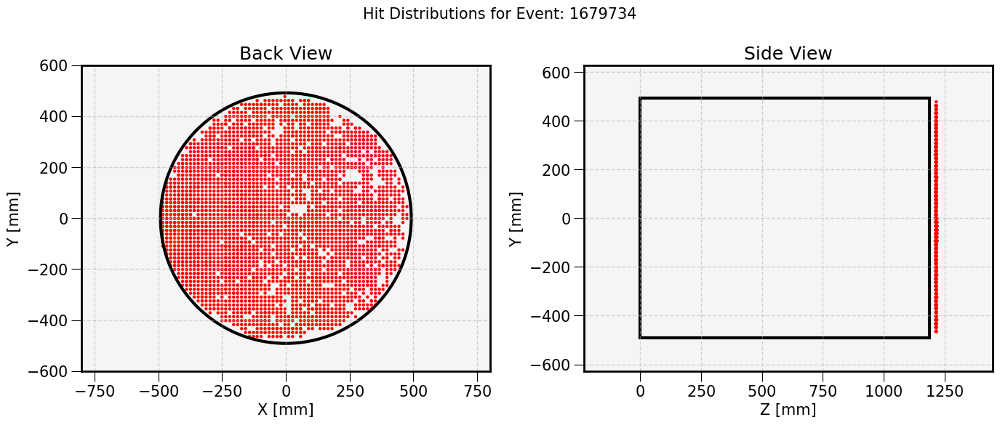

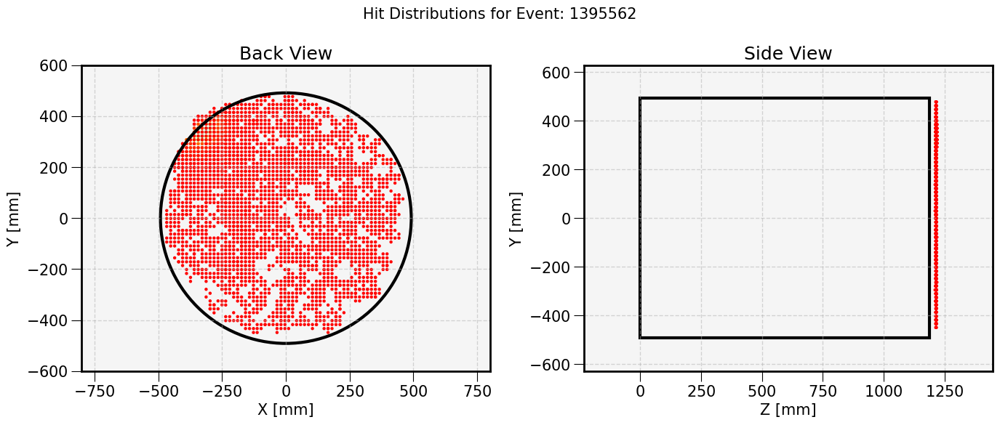

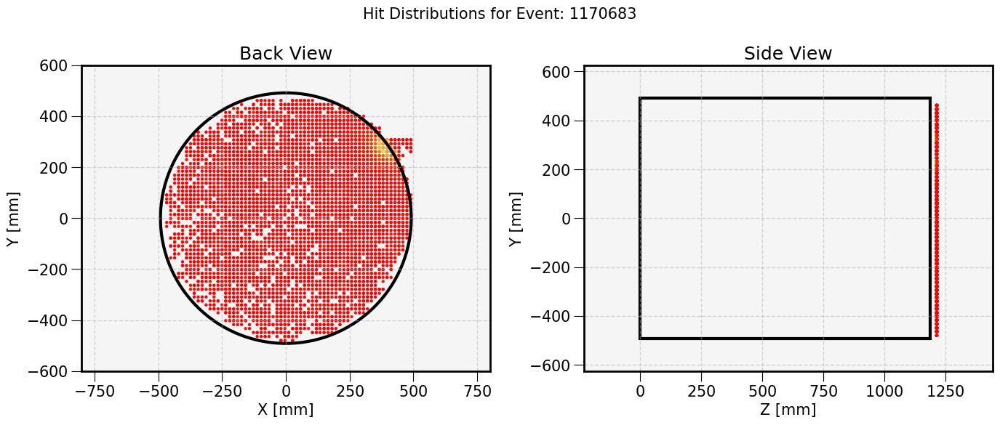

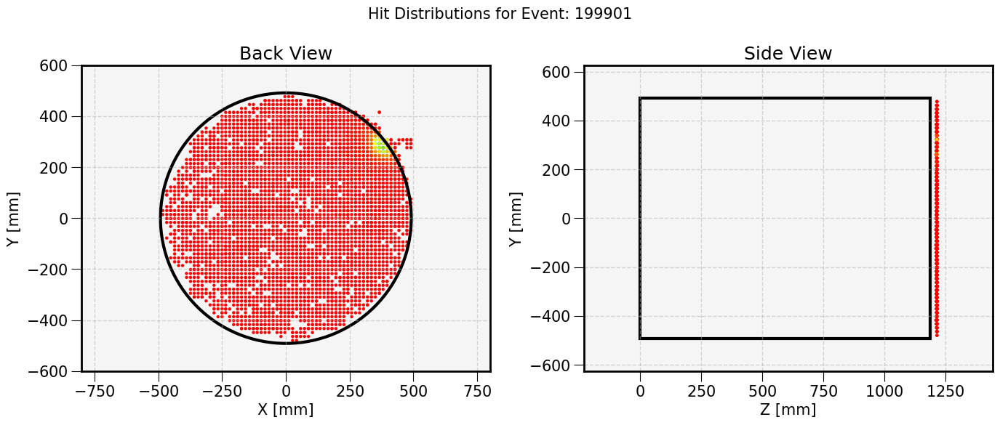

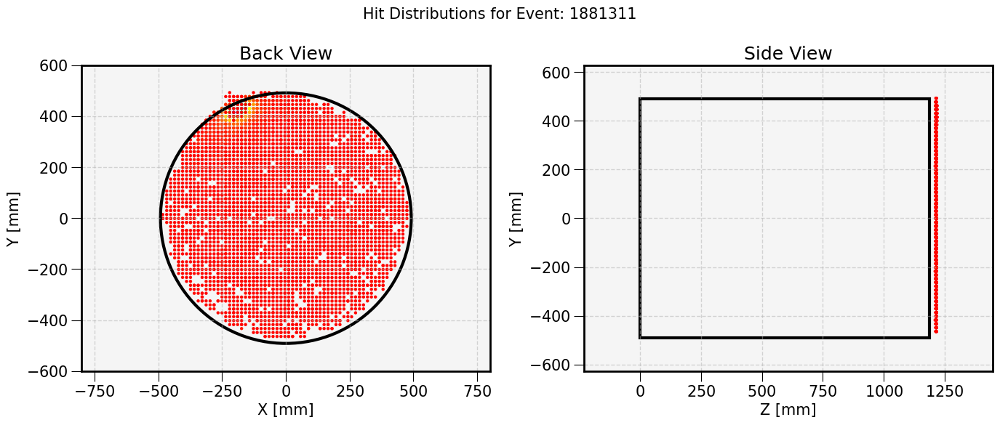

...

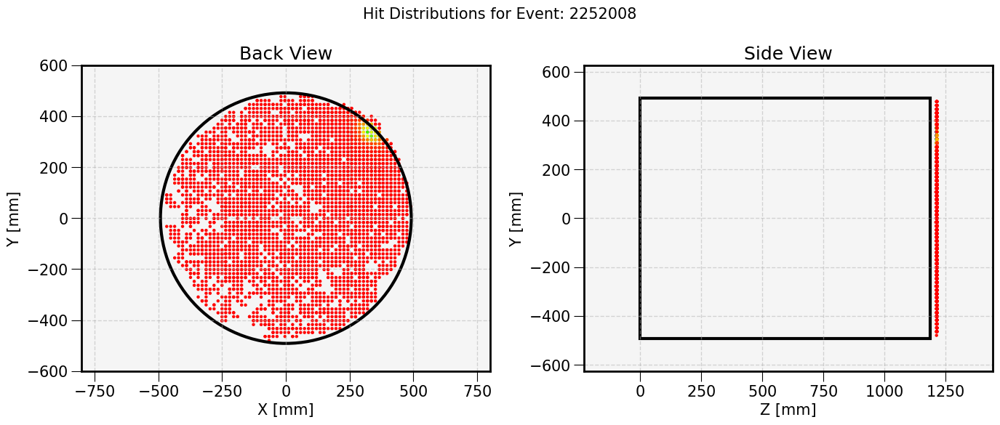

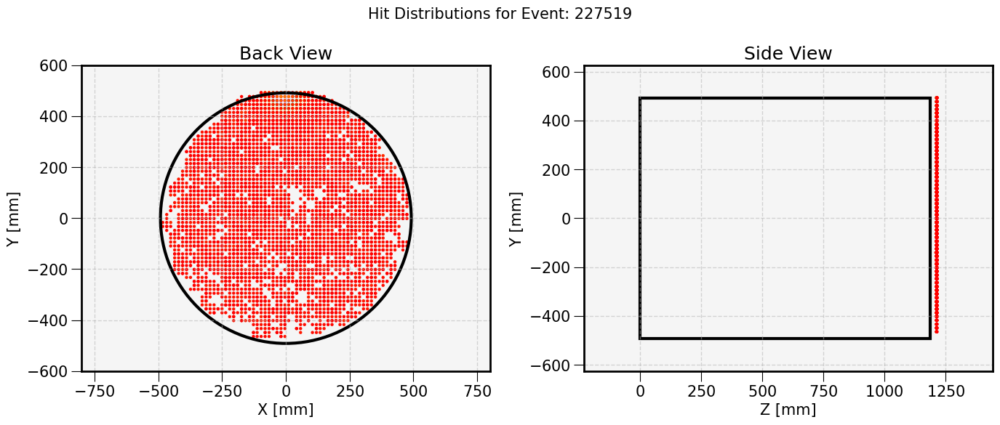

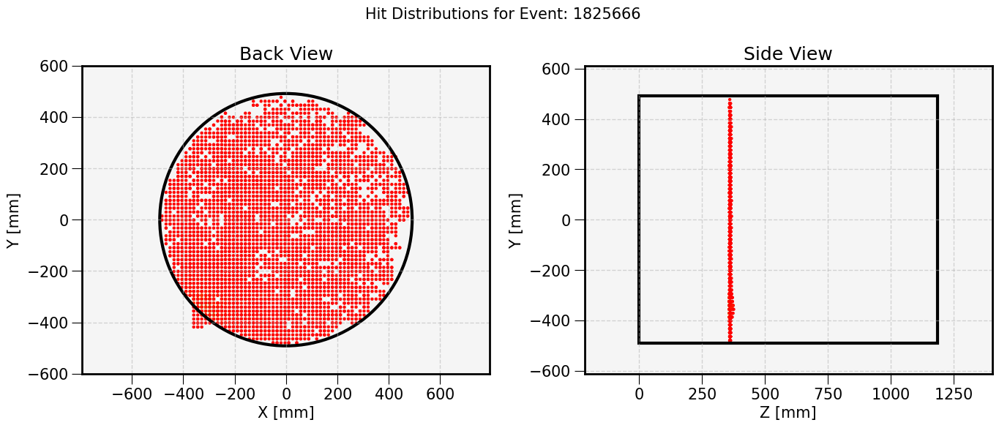

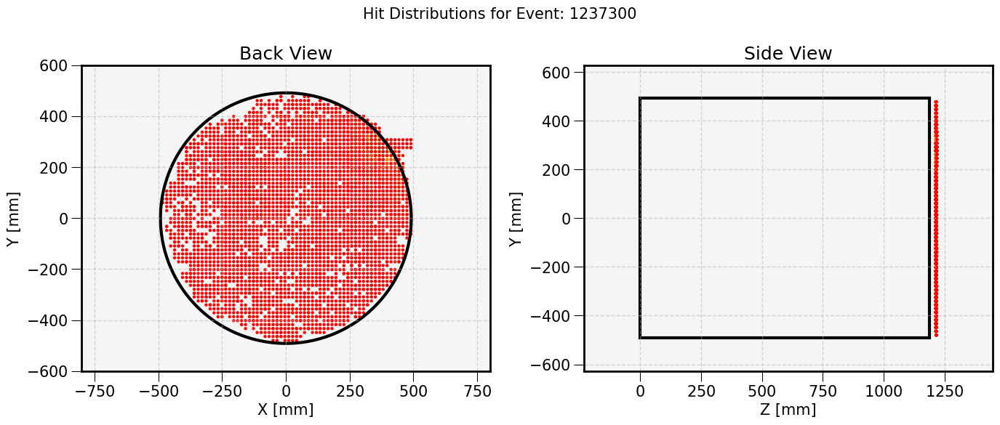

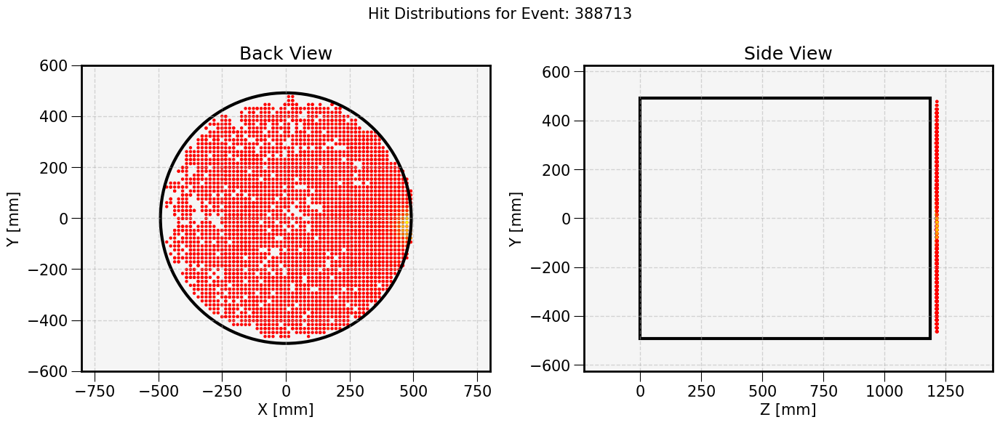

In [29]:
# Events of interest
elec_anode = SEL_DATA[CONDITION_FLAG]['Sophronia']['Electron']['Anode']
elec_anode = elec_anode[elec_anode.Z > 300]

# Create a random sample of events to display
EVENTS_TO_DISPLAY = elec_anode['event'].sample(n=50).tolist()

# ----- Plotting ----- #
for event_id in EVENTS_TO_DISPLAY:
    pt.event_display(SEL_DATA[CONDITION_FLAG]['Sophronia']['Electron']['Anode'], event=event_id)

I think these _wrong_ anode events come from a bad selection when I use __nS1 = 0__, let's see...

In [24]:
temp_df = elec_anode[elec_anode['event'] == 1916831]
temp_df

,event,time,npeak,X,Y,DT,Q,E,corr_factor,E_corr,Z
6517347,1916831,1.754569e+09,2,-142.525,260.475,730.758938,5.169621,67.626937,0.000005,0.000377,632.106481
6517348,1916831,1.754569e+09,2,-404.875,-232.625,734.092562,6.064956,179.344578,0.000008,0.001544,634.990067
6517349,1916831,1.754569e+09,2,-389.325,-78.125,734.092562,5.823111,172.193051,0.000006,0.001029,634.990067
6517350,1916831,1.754569e+09,2,-420.425,137.575,734.092562,5.026183,148.627404,0.000006,0.001022,634.990067
6517351,1916831,1.754569e+09,2,-420.425,260.975,734.092562,9.321331,275.637635,0.000006,0.001641,634.990067
...,...,...,...,...,...,...,...,...,...,...,...
6519094,1916831,1.754569e+09,2,-3.575,-356.525,740.236188,5.459925,3.276255,0.000006,0.000019,640.304302
6519095,1916831,1.754569e+09,2,26.525,-170.925,740.236188,5.705613,3.423681,0.000005,0.000019,640.304302
6519096,1916831,1.754569e+09,2,134.375,29.225,740.236188,5.395360,3.237512,0.000005,0.000018,640.304302
6519097,1916831,1.754569e+09,2,273.325,106.475,740.236188,6.306531,3.784265,0.000005,0.000021,640.304302


#### Cathode

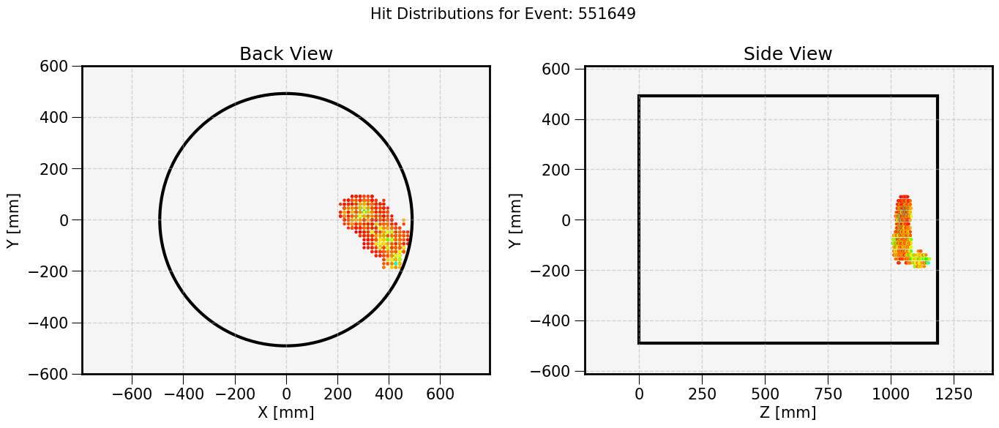

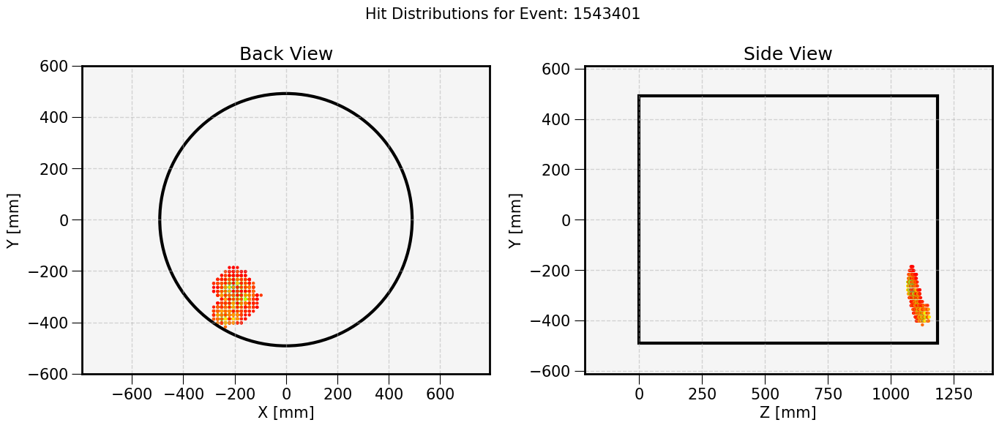

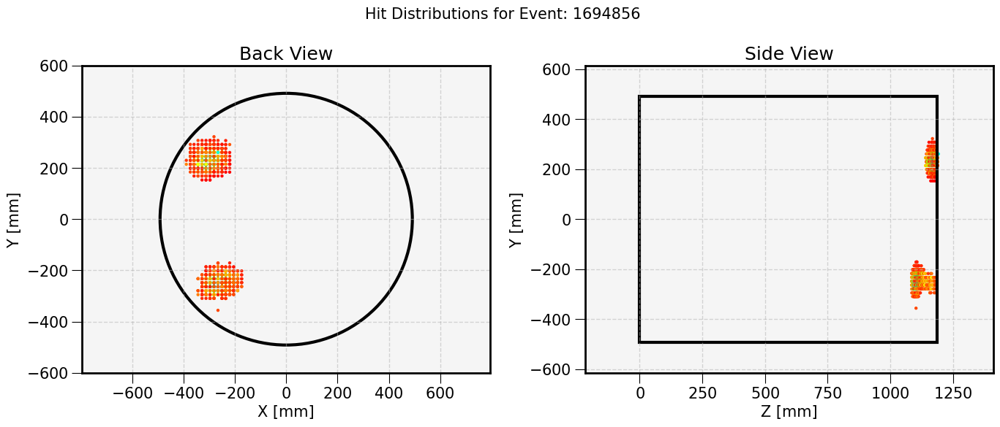

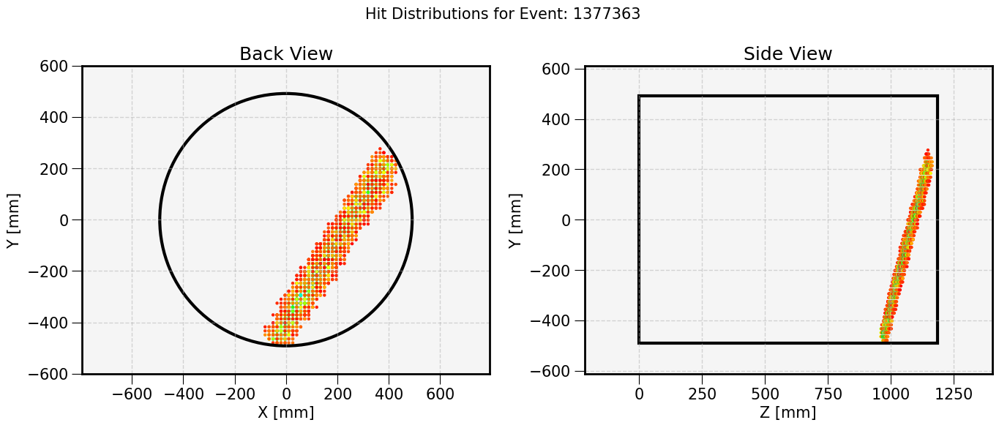

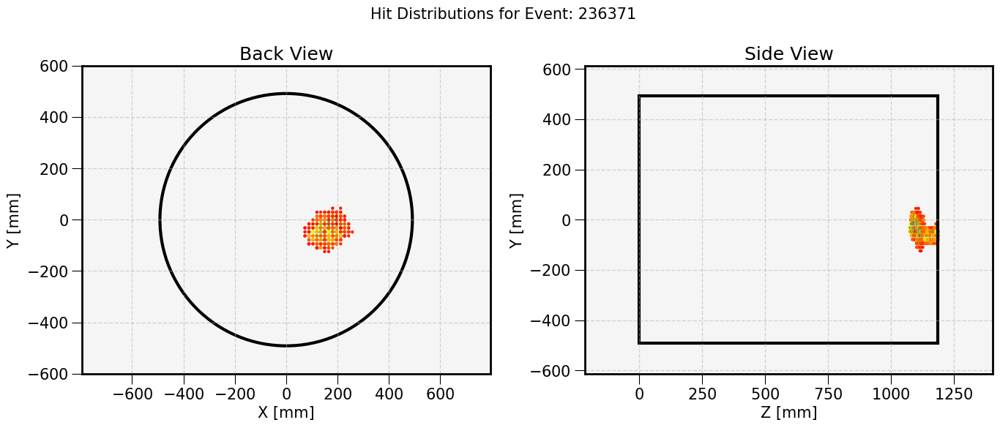

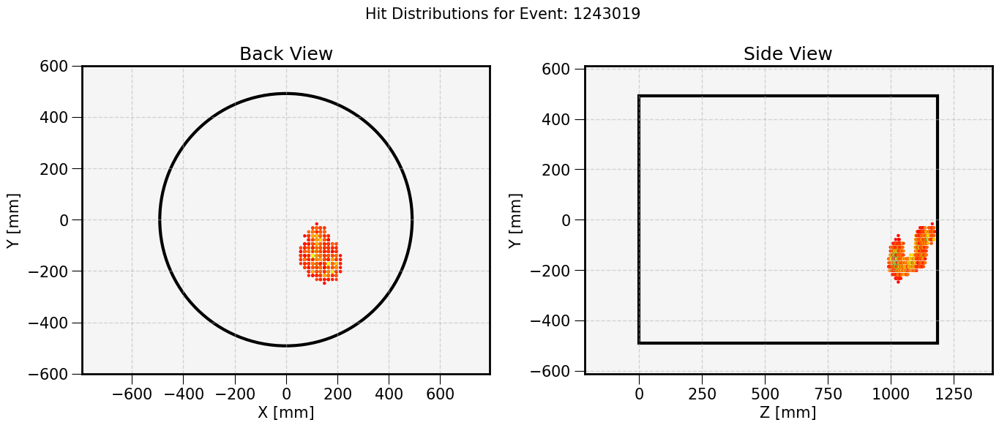

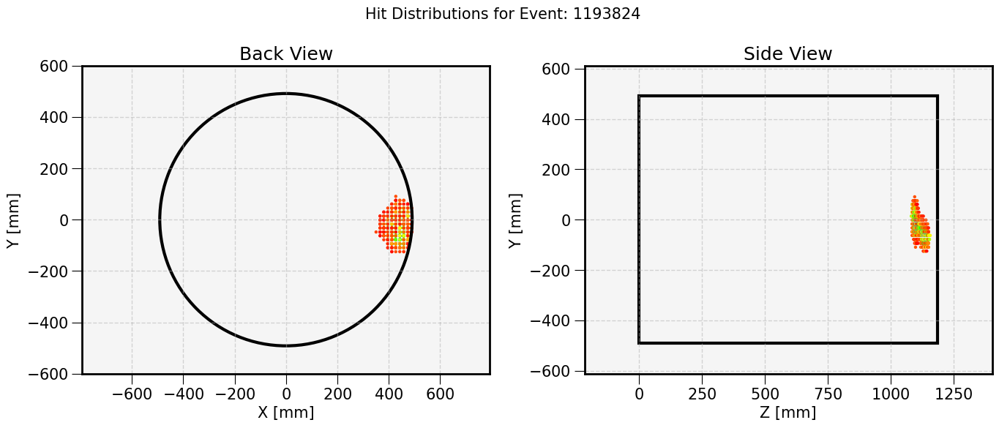

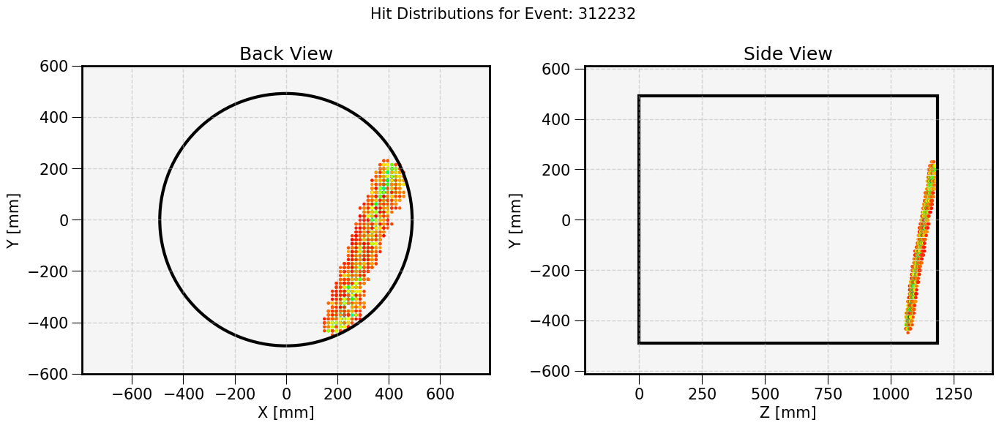

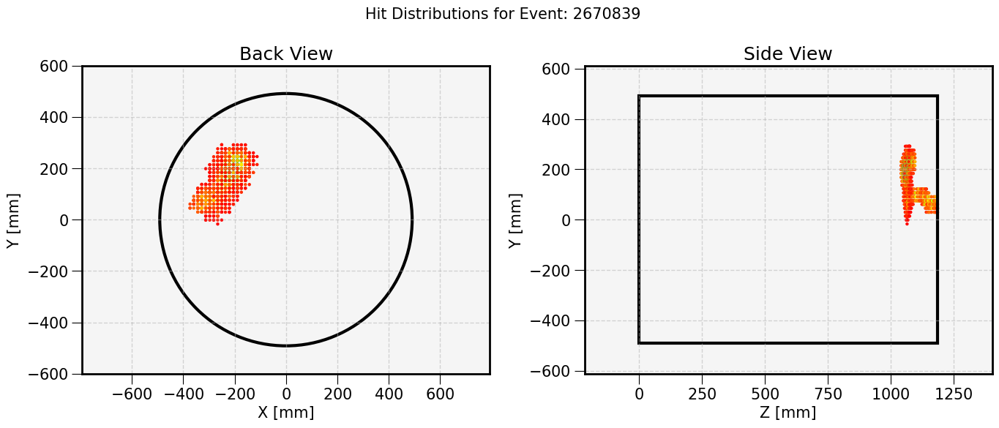

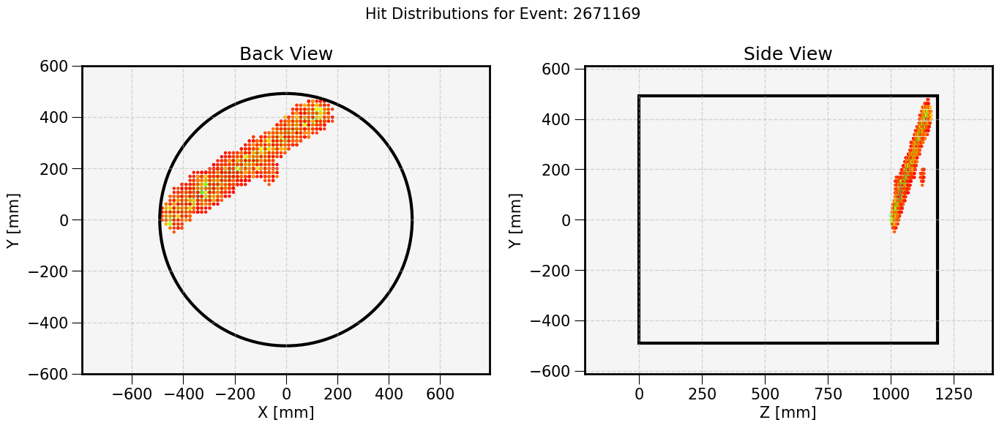

In [32]:
# Events of interest
elec_cathode = SEL_DATA[CONDITION_FLAG]['Sophronia']['Electron']['Cathode']
elec_cathode = elec_cathode[elec_cathode.Z < 1100]

# Create a random sample of events to display
EVENTS_TO_DISPLAY = elec_cathode['event'].sample(n=10).tolist()

# ----- Plotting ----- #
for event_id in EVENTS_TO_DISPLAY:
    pt.event_display(SEL_DATA[CONDITION_FLAG]['Sophronia']['Electron']['Cathode'], event=event_id)

## Alphas

#### Tube

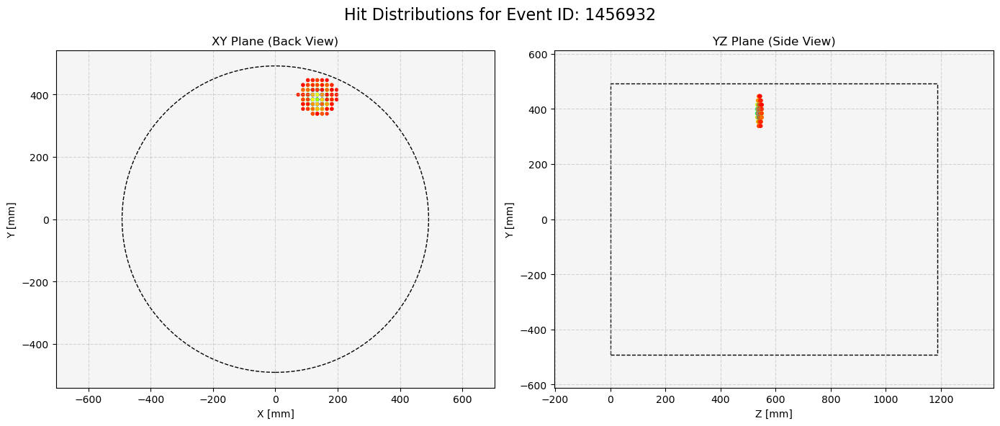

In [ ]:
pt.evd_interactive(SEL_DATA[CONDITION_FLAG]['Sophronia']['Alpha']['Tube'])

#### Anode

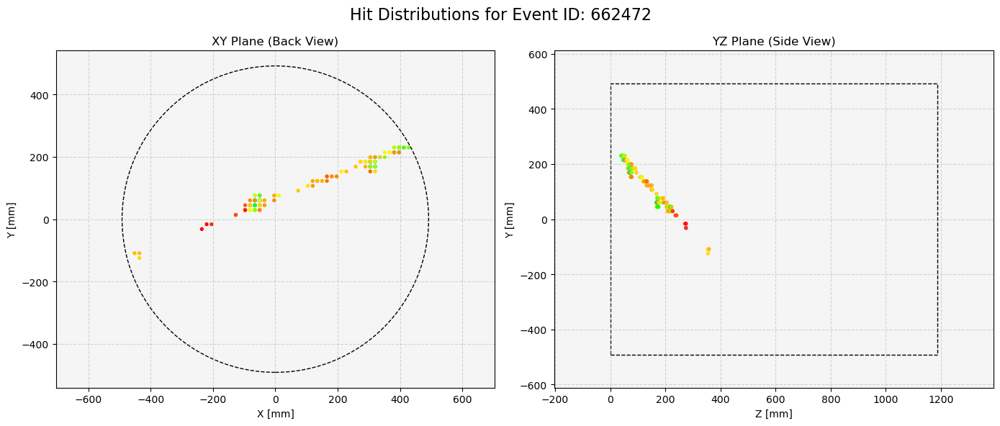

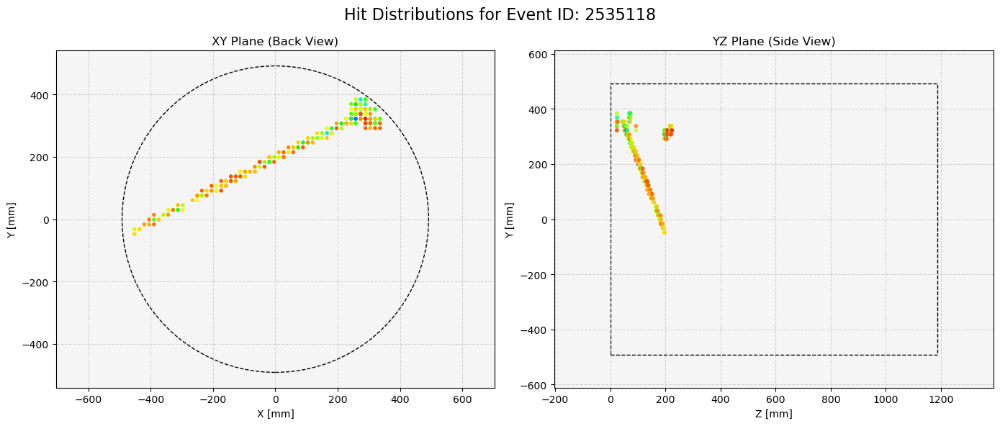

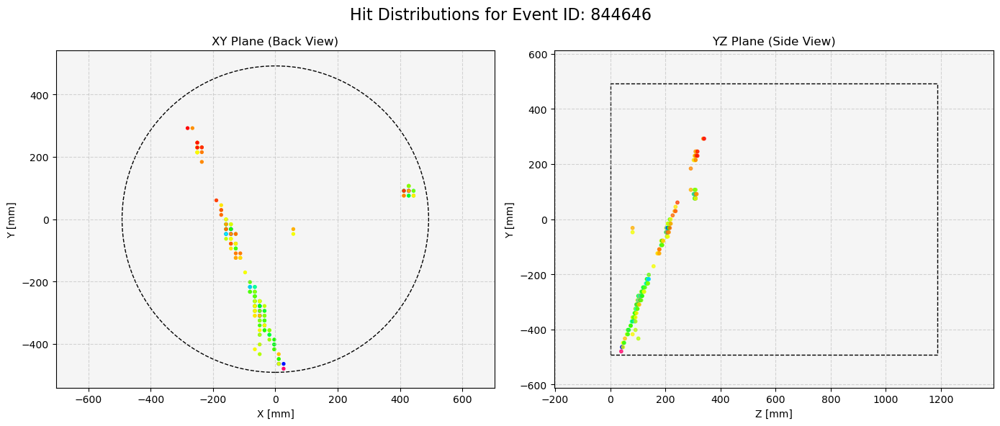

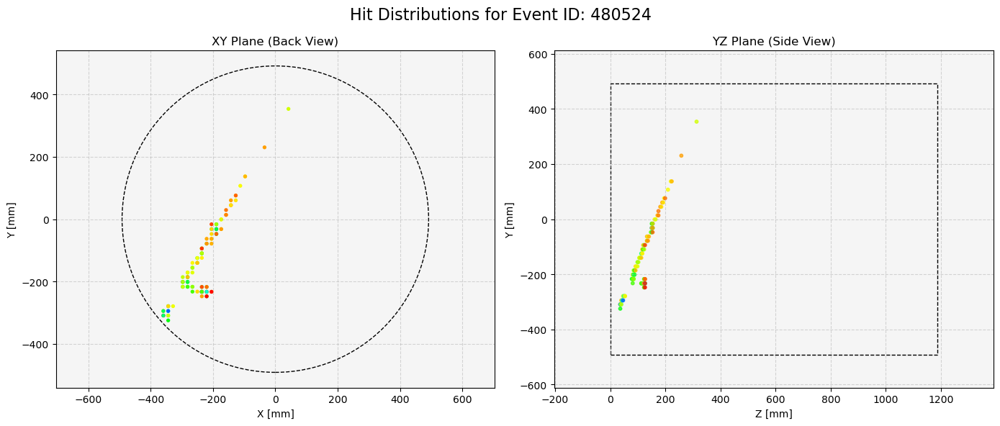

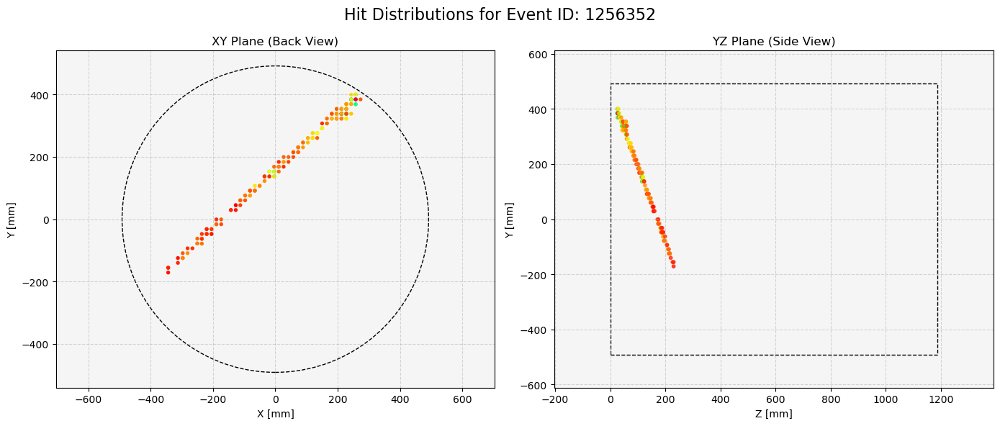

In [ ]:
# Events of interest
alphas_anode = SEL_DATA[CONDITION_FLAG]['Sophronia']['Alpha']['Anode']
alphas_anode = alphas_anode[alphas_anode.Z > 200]

# ----- Plotting ----- #
for i in alphas_anode.event.unique().tolist():
    pt.evd_interactive(SEL_DATA[CONDITION_FLAG]['Sophronia']['Alpha']['Anode'], event=i)

#### Cathode

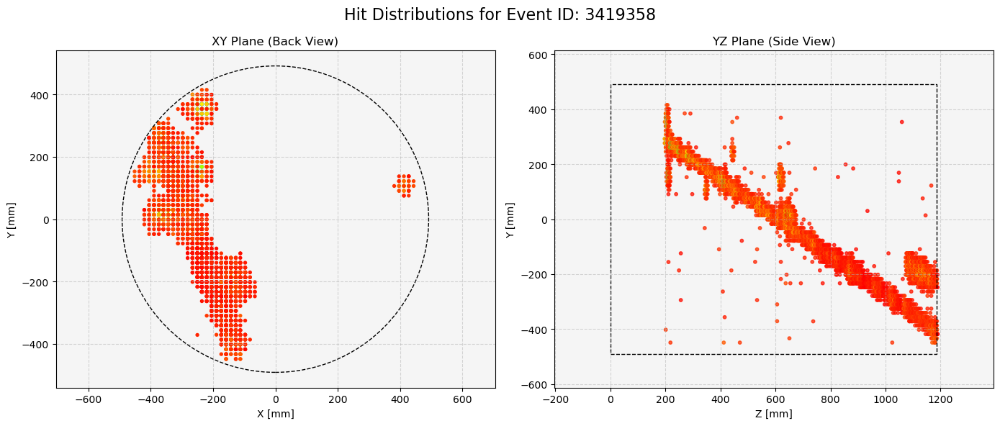

In [ ]:
# Events of interest
alphas_cathode = SEL_DATA[CONDITION_FLAG]['Sophronia']['Alpha']['Cathode']
alphas_cathode = alphas_cathode[alphas_cathode.Zc < 600]

# ----- Plotting ----- #
for i in alphas_cathode.event.unique().tolist():
    pt.evd_interactive(SEL_DATA[CONDITION_FLAG]['Sophronia']['Alpha']['Cathode'], event=i)